- load data
- build labeled iterator
- build validation iterator
- build networks
- load pretrained network
- build PUMAP
- for each epoch
  - build umap graph
  - create data iterator
  - train epoch

In [1]:
# reload packages
%load_ext autoreload
%autoreload 2

### Choose GPU

In [2]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [3]:
import tensorflow as tf
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if len(gpu_devices)>0:
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
print(gpu_devices)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
tf.keras.backend.clear_session()

### dataset information

In [5]:
from datetime import datetime

dataset = "moons"
dims = (52)
umap_prop = 0.0
num_classes = 2
PROJECTION_DIMS = 1024
labels_per_class = 52  #'full'
datestring = datetime.now().strftime("%Y_%m_%d_%H_%M_%S_%f")
datestring = (
    str(dataset)
    + "_"
    + str(umap_prop)
    + "_"
    + str(PROJECTION_DIMS)
    + "_"
    + str(labels_per_class)
    + "____"
    + datestring
    + "__learned-metric"
)
print(datestring)

moons_0.0_1024_52____2020_08_06_12_53_14_077510__learned-metric


### Load packages

In [6]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
from IPython import display
import pandas as pd
import umap
import copy
import os, tempfile

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### Load dataset

In [7]:
from tfumap.load_datasets import load_MOONS, mask_labels

In [8]:
X_train, X_test, X_valid, Y_train, Y_test, Y_valid = load_MOONS(noise= 0.01, random_state = 1)

In [9]:
if labels_per_class == "full":
    X_labeled = X_train
    Y_masked = Y_labeled = Y_train
else:
    X_labeled, Y_labeled, Y_masked = mask_labels(
        X_train, Y_train, labels_per_class=labels_per_class
    )

(2000, 104, 1000)

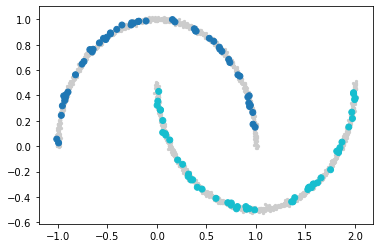

In [10]:
plt.scatter(X_train[:,0], X_train[:,1], color='#CCCCCC', s=5)
plt.scatter(X_labeled[:,0], X_labeled[:,1], c=Y_labeled, cmap = plt.cm.tab10)
len(X_train), len(X_labeled), len(X_valid)

In [11]:
n_dims = 50
train_noise = np.random.uniform(-1, 1, size=(len(X_train), n_dims))
label_noise = np.random.uniform(-1, 1, size=(len(X_labeled), n_dims))
test_noise = np.random.uniform(-1, 1, size=(len(X_test), n_dims))
valid_noise = np.random.uniform(-1, 1, size=(len(X_valid), n_dims))

X_train = np.concatenate([X_train[:,:2], train_noise], axis=1)
X_labeled = np.concatenate([X_labeled[:,:2], label_noise], axis=1)
X_test = np.concatenate([X_test[:,:2], test_noise], axis=1)
X_valid = np.concatenate([X_valid[:,:2], valid_noise], axis=1)

### Build data iterators

In [12]:
from tfumap.umap import compute_cross_entropy, get_graph_elements
from tfumap.semisupervised import create_edge_iterator, create_validation_iterator, create_classification_iterator

In [13]:
batch_size = 1000

In [14]:
# make sure batch size is no bigger than the number of labels per class
labeled_batch_size = batch_size if batch_size < len(Y_labeled) else len(Y_labeled)
labeled_batch_size = 128
labeled_iter = create_classification_iterator(X_labeled, Y_labeled, batch_size=batch_size)
print(labeled_batch_size)

128


In [15]:
data_valid, n_valid_samp = create_validation_iterator(X_valid, Y_valid, batch_size, repeat=True)

### Build network

In [16]:
encoder = tf.keras.Sequential()
encoder.add(tf.keras.layers.InputLayer(input_shape=dims))
encoder.add(tf.keras.layers.Dense(units=256, activation="relu"))
encoder.add(tf.keras.layers.Dense(units=256, activation="relu"))
encoder.add(tf.keras.layers.Dense(PROJECTION_DIMS, activation=None))

In [17]:
classifier = tf.keras.Sequential()
classifier.add(tf.keras.layers.InputLayer(input_shape=PROJECTION_DIMS))
classifier.add(tf.keras.layers.Dense(units=256, activation="relu"))
classifier.add(tf.keras.layers.Dense(units=256, activation="relu"))
classifier.add(tf.keras.layers.Dense(num_classes, activation='softmax', name="predictions"))

In [18]:
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               13568     
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              263168    
Total params: 342,528
Trainable params: 342,528
Non-trainable params: 0
_________________________________________________________________


In [19]:
classifier.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 256)               262400    
_________________________________________________________________
dense_4 (Dense)              (None, 256)               65792     
_________________________________________________________________
predictions (Dense)          (None, 2)                 514       
Total params: 328,706
Trainable params: 328,706
Non-trainable params: 0
_________________________________________________________________


### load weights

In [20]:
from umap import UMAP

In [21]:
from tfumap.paths import MODEL_DIR

In [22]:
#load_loc = "cifar10_0.0_1024_64____2020_07_31_17_11_05_811717"
#encoder.load_weights((MODEL_DIR / 'semisupervised' / dataset / load_loc / "encoder").as_posix())
#classifier.load_weights((MODEL_DIR / 'semisupervised' / dataset / load_loc / "classifier").as_posix())

### Look at pretrained state

In [23]:
def model_data(X, batch_size, model):
    """ embed a set of points in X to Z
    """
    n_batch = int(np.ceil(len(X) / batch_size))
    return np.vstack(
        [
                model(np.array(X[(i) * batch_size : (i + 1) * batch_size, :]))
            for i in tqdm(range(n_batch), leave=False)
        ]
    )

In [24]:
pred_model = tf.keras.models.Model(classifier.input,[classifier.get_layer(name="dense_4").get_output_at(0)])

In [25]:
z_enc = model_data(X_valid, 100, encoder)
last_layer_class = model_data(z_enc, batch_size, pred_model)
z_pred = model_data(z_enc, batch_size, classifier)
confidence = np.max(z_pred, axis = 1)

In [26]:
valid_acc = tf.keras.metrics.sparse_categorical_accuracy(
    Y_valid, z_pred
).numpy()
print(np.mean(valid_acc))

0.491


In [27]:
umap_class = UMAP(verbose=True).fit_transform(last_layer_class)

UMAP(dens_frac=0.0, dens_lambda=0.0, verbose=True)
Construct fuzzy simplicial set
Thu Aug  6 12:53:22 2020 Finding Nearest Neighbors
Thu Aug  6 12:53:24 2020 Finished Nearest Neighbor Search
Thu Aug  6 12:53:27 2020 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Aug  6 12:53:31 2020 Finished embedding


In [28]:
conf_thresh =  0.0#99
conf_mask = confidence > conf_thresh
umap_class_conf = UMAP(verbose=True).fit_transform(last_layer_class[conf_mask])

UMAP(dens_frac=0.0, dens_lambda=0.0, verbose=True)
Construct fuzzy simplicial set
Thu Aug  6 12:53:32 2020 Finding Nearest Neighbors
Thu Aug  6 12:53:32 2020 Finished Nearest Neighbor Search
Thu Aug  6 12:53:32 2020 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Aug  6 12:53:36 2020 Finished embedding


In [29]:
classifications = np.argmax(z_pred, axis=1)
correctness = classifications == Y_valid

Text(0.5, 1.0, 'Confidence')

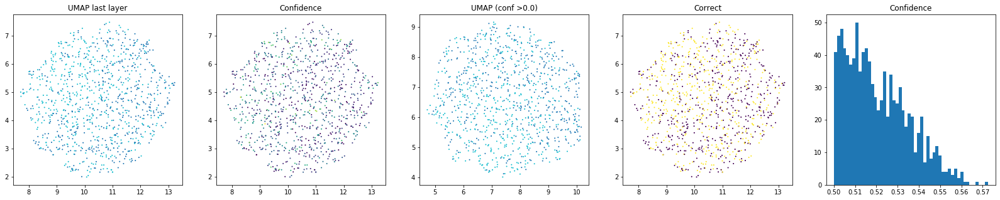

In [30]:
fig, axs = plt.subplots(ncols = 5, figsize=(28,5))
axs[0].scatter(umap_class[:,0], umap_class[:,1], s=1, c = Y_valid, cmap = plt.cm.tab10)
axs[0].set_title('UMAP last layer')
axs[1].scatter(umap_class[:,0], umap_class[:,1], s=1, c = confidence, cmap = plt.cm.viridis)
axs[1].set_title('Confidence')
axs[2].scatter(umap_class_conf[:,0], umap_class_conf[:,1], s=1, c = Y_valid[conf_mask], cmap = plt.cm.tab10)
axs[2].set_title('UMAP (conf >{})'.format(conf_thresh) )
axs[3].scatter(umap_class[:,0], umap_class[:,1], s=1, c = correctness, cmap = plt.cm.viridis)
axs[3].set_title('Correct')
axs[4].hist((confidence), bins = 50);
axs[4].set_title('Confidence')

### Create UMAP object

In [31]:
from tfumap.semisupervised_model import PUMAP, compute_classifier_loss

In [32]:
def compute_umap_loss(
    batch_to,
    batch_from,
    encoder,
    _a,
    _b,
    negative_sample_rate=5,
    repulsion_strength=1,
):
    """
        compute the cross entropy loss for learning embeddings

        Parameters
        ----------
        batch_to : tf.int or tf.float32
            Either X or the index locations of the embeddings for verticies (to)
        batch_from : tf.int or tf.float32
            Either X or the index locations of the embeddings for verticies (from)

        Returns
        -------
        ce_loss : tf.float
            cross entropy loss for UMAP
        embedding_to : tf.float
            embeddings for verticies (to)
        embedding_from : tf.float
            embeddings for verticies (from)
        """

    # encode
    embedding_to = encoder(batch_to)
    embedding_from = encoder(batch_from)

    # get negative samples
    embedding_neg_to = tf.repeat(embedding_to, negative_sample_rate, axis=0)
    repeat_neg = tf.repeat(embedding_from, negative_sample_rate, axis=0)
    embedding_neg_from = tf.gather(
        repeat_neg, tf.random.shuffle(tf.range(tf.shape(repeat_neg)[0]))
    )

    #  distances between samples
    distance_embedding = tf.concat(
        [
            tf.norm(embedding_to - embedding_from, axis=1),
            tf.norm(embedding_neg_to - embedding_neg_from, axis=1),
        ],
        axis=0,
    )

    # convert probabilities to distances
    probabilities_distance = convert_distance_to_probability(distance_embedding, _a, _b)

    # treat positive samples as p=1, and negative samples as p=0
    probabilities_graph = tf.concat(
        [tf.ones(embedding_to.shape[0]), tf.zeros(embedding_neg_to.shape[0])], axis=0,
    )

    # cross entropy loss
    (attraction_loss, repellant_loss, ce_loss) = compute_cross_entropy(
        probabilities_graph,
        probabilities_distance,
        repulsion_strength=repulsion_strength,
    )

    return (
        attraction_loss,
        repellant_loss,
        ce_loss,
    )


In [33]:
import tensorflow as tf
from tfumap.umap import compute_cross_entropy, convert_distance_to_probability
from tfumap.semisupervised import (
    find_a_b,
    #compute_umap_loss,
    # compute_classifier_loss,
    batch_data,
)
import numpy as np
import os, tempfile
from tqdm.autonotebook import tqdm
from datetime import datetime


@tf.function
def compute_classifier_loss(X, y, encoder, classifier, sparse_ce, acc_func):
    """ compute the cross entropy loss for classification
        """
    d = classifier(encoder(X))
    loss = sparse_ce(y, d)
    acc = acc_func(y, d)
    #acc = tf.keras.metrics.sparse_categorical_accuracy(y, d)
    return loss, acc


class PUMAP(tf.keras.Model):
    def __init__(
        self,
        encoder,
        classifier,
        tensorboard_logdir=None,  # directory for tensorboard log
        min_dist=0.1,
        negative_sample_rate=5.0,
        optimizer=tf.keras.optimizers.SGD(0.1),
        repulsion_strength=1.0,
        # ** kwargs,
    ):
        super(PUMAP, self).__init__()
        # self.__dict__.update(kwargs)

        # subnetworks
        self.encoder = encoder
        self.classifier = classifier


        # optimizer for cross entropy minimization
        self.optimizer = optimizer
        self.repulsion_strength = repulsion_strength
        self.negative_sample_rate = negative_sample_rate

        # get a,b for current min_dist
        self._a, self._b = find_a_b(min_dist)

        # create summary writer to log loss information during training
        if tensorboard_logdir is None:
            self.tensorboard_logdir = os.path.join(
                tempfile.gettempdir(),
                "tensorboard",
                datetime.now().strftime("%Y%m%d-%H%M%S"),
            )
        else:
            self.tensorboard_logdir = tensorboard_logdir
        self.summary_writer_train = tf.summary.create_file_writer(
            self.tensorboard_logdir + "/train"
        )
        self.summary_writer_valid = tf.summary.create_file_writer(
            self.tensorboard_logdir + "/valid"
        )

        # sparse categorical cross entropy
        self.sparse_ce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        self.class_acc = tf.keras.metrics.SparseCategoricalAccuracy()
        self.class_acc_val = tf.keras.metrics.SparseCategoricalAccuracy()

        # self.create_summary_metrics()

    @tf.function
    def train(self, batch_to, batch_from, X, y, umap_prop = 1.0, save_loss=False):
        """ One training step 
        Input are points and weights for positive and negative 
        samples for training. 
            
        """
        if umap_prop > 0:
            with tf.GradientTape() as tape:

                (attraction_loss, repellant_loss, umap_loss) = compute_umap_loss(
                    batch_to,
                    batch_from,
                    self.encoder,
                    self._a,
                    self._b,
                    self.negative_sample_rate,
                    self.repulsion_strength,
                )
            
                classifier_loss, classifier_acc = compute_classifier_loss(
                    X, y, self.encoder, self.classifier, self.sparse_ce, self.class_acc
                )
                loss = (
                    tf.reduce_mean(classifier_loss)
                    + tf.reduce_mean(umap_loss) * umap_prop
                )

            train_vars = (
                self.encoder.trainable_variables
                + self.classifier.trainable_variables
            )
        else:  # ignore running costly UMAP computations if not training on UMAP loss
            with tf.GradientTape() as tape:
                classifier_loss, classifier_acc = compute_classifier_loss(
                    X, y, self.encoder, self.classifier, self.sparse_ce, self.class_acc
                )
                loss = classifier_loss
            train_vars = (
                self.encoder.trainable_variables + self.classifier.trainable_variables
            )
            attraction_loss = repellant_loss = umap_loss = 0

        # compute gradient for umap
        grad = tape.gradient(loss, train_vars)

        # gradients are cliped in UMAP implementation. Any effect here?
        grad = [tf.clip_by_value(grad, -4.0, 4.0) for grad in grad]

        self.optimizer.apply_gradients(zip(grad, train_vars))

        return (
            attraction_loss,
            repellant_loss,
            tf.reduce_mean(umap_loss),
            classifier_loss,
            classifier_acc,
        )

    @tf.function
    def write_losses(
        self,
        step,
        classifier_acc,
        classifier_loss,
        umap_loss,
        classifier_loss_val,
        classifier_acc_val,
    ):
        # write train loss
        with self.summary_writer_train.as_default():
            tf.summary.scalar(
                "classif_acc", classifier_acc, step=step,
            )
            tf.summary.scalar(
                "classif_loss", classifier_loss, step=step,
            )
            tf.summary.scalar(
                "umap_loss", umap_loss, step=step,
            )
            self.summary_writer_train.flush()
        # write valid loss
        with self.summary_writer_valid.as_default():
            tf.summary.scalar(
                "classif_acc", classifier_acc_val, step=step,
            )
            tf.summary.scalar(
                "classif_loss", classifier_loss_val, step=step,
            )
            self.summary_writer_valid.flush()



In [34]:
### Initialize model
model = PUMAP(
    min_dist = 0.0,
    negative_sample_rate = 5, # how many negative samples per positive
    optimizer=tf.keras.optimizers.Adam(1e-3), # cross-entropy optimizer
    encoder=encoder,
    classifier=classifier,    
)

### plotting results

In [35]:
from tfumap.umap import retrieve_tensors
from sklearn.decomposition import PCA
import seaborn as sns
from umap import UMAP 

def plot_umap_classif_results(
    model,
    X_valid,
    Y_valid,
    X_train,
    X_labeled,
    Y_labeled,
    batch_size,
    dralg = PCA, #umap
    cmap="coolwarm",
    cmap2="bwr",
):
    # get loss dataframe from tensorboard
    try:
        loss_df = retrieve_tensors(model.tensorboard_logdir)
        losses_exist = True
    except ValueError as e:
        print(e)
        losses_exist = False

    pred_model = tf.keras.models.Model(model.classifier.input,[model.classifier.get_layer(name="dense_4").get_output_at(0)])

    # embed data
    enc_valid = model_data(X_valid, batch_size, model.encoder)
    class_valid = model_data(enc_valid, batch_size, pred_model)
    pred_valid = model_data(enc_valid, batch_size, model.classifier)

    enc_lab = model_data(X_labeled, batch_size, model.encoder)
    class_lab = model_data(enc_lab, batch_size, pred_model)
    pred_lab = model_data(enc_lab, batch_size, model.classifier)

    # get classifications and correctness
    classifications_valid = np.argmax(pred_valid, axis=1)
    correctness_valid = classifications_valid == Y_valid

    classifications_lab = np.argmax(pred_lab, axis=1)
    correctness_lab = classifications_lab == np.array(Y_labeled)

    confidence_lab  = np.max(pred_lab, axis=1)
    confidence_valid = np.max(pred_valid, axis=1)

    thresh = 0.0 #0.8
    mask_valid = confidence_valid > thresh
    mask_lab = confidence_lab > thresh

    # embed into 2D 
    dr = dralg()
    enc_valid_2 = dr.fit_transform(enc_valid[mask_valid])
    enc_lab_2 = dr.transform(enc_lab[mask_lab])

    dr = dralg()
    class_valid_2 = dr.fit_transform(class_valid[mask_valid])
    class_lab_2 = dr.transform(class_lab[mask_lab])
    
    fig, axs = plt.subplots(ncols=4, nrows=3, figsize=(14, 10), gridspec_kw = {'wspace':0, 'hspace':0})
    for row, (z_val, z_lab, z_title) in enumerate([
        [enc_valid_2, enc_lab_2, 'encoder'], 
        [class_valid_2, class_lab_2, 'last_layer_classifier'], 

    ]):
        for col, (y_valid, y_labeled, label_name) in enumerate([
            [Y_valid, Y_labeled, 'ground_truth'],
            [classifications_valid, classifications_lab, 'predictions'],
            [correctness_valid, correctness_lab, 'correctness'],
            [confidence_valid, confidence_lab, 'confidence'],
        ]):
            ax = axs[row, col]
            #ax.axis('off')
            if col == 0:
                ax.set_ylabel(z_title)
            if row == 0:
                ax.set_title(label_name)
            #ax.set_title(z_title + '_' + label_name)
            ax.scatter(
                z_val[:, 0],
                z_val[:, 1],
                c=y_valid[mask_valid],
                cmap=cmap if label_name not in ["correctness", "confidence"]  else 'viridis',  # "tab10"
                s=2,
                alpha=0.25,
                rasterized=True,
            )
            if False:
                ax.scatter(
                    z_lab[:, 0],
                    z_lab[:, 1],
                    c=y_labeled[mask_lab],
                    cmap=cmap if label_name not in ["correctness", "confidence"] else 'viridis',  # "tab10"
                    s=20,
                    alpha=0.25,
                    rasterized=True,
                )
            ax.set_xticks([])
            ax.set_yticks([])
        
    plt.show()
    
    fig, axs = plt.subplots(ncols=3, figsize=(13.4,3))
    if losses_exist:
        ax = axs[0]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "umap_loss"],
            ci=None,
            ax=ax,
        )
        ax.legend(loc="upper right")
        ax.set_xscale("log")
        ax.set_title("UMAP loss", fontsize=24)
        ax.set_ylabel("Cross Entropy")
        
        ax = axs[1]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "classif_loss"],
            ci=None,
            ax=ax,
        )
        ax.set_xscale("log")
        ax.legend(loc="upper right")
        # ax.set_yscale("log")
        ax.set_title("Classif loss", fontsize=24)
        ax.set_ylabel("Cross Entropy")
        
        ax = axs[2]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "classif_acc"],
            ci=None,
            ax=ax,
        )
        ax.set_xscale("log")
        ax.legend(loc="lower right")
        ax.set_title("Classif acc", fontsize=24)
        ax.set_ylabel("Acc")
    plt.show()

No objects to concatenate


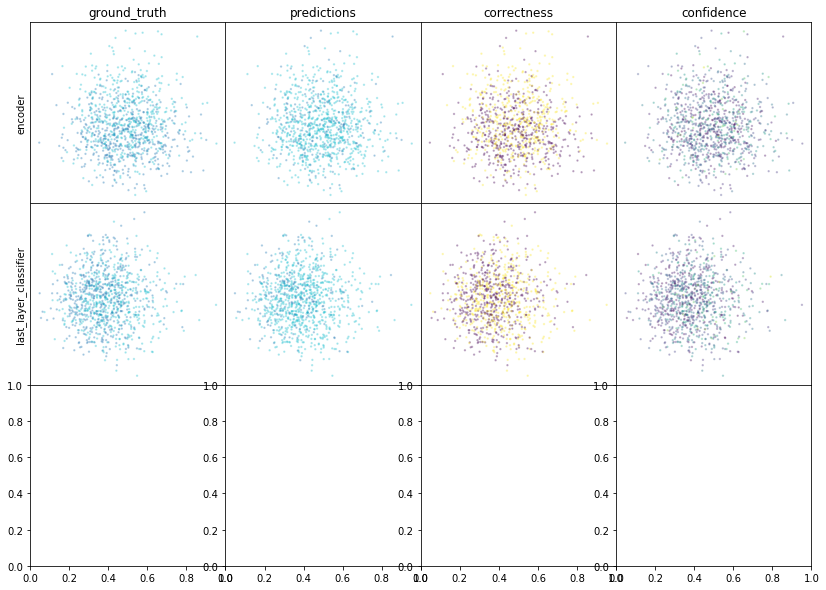

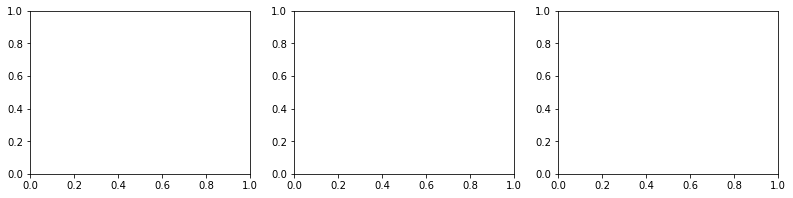

In [36]:
plot_umap_classif_results(model, X_valid, Y_valid, X_train, X_labeled, Y_labeled, batch_size, dralg=PCA, cmap='tab10', cmap2='tab10')

In [37]:
def get_elements(batch_to, batch_from):
    return tf.gather(X_train, batch_to), tf.gather(X_train, batch_from)

def create_edge_iterator(
    head, tail, weight, batch_size, max_sample_repeats_per_epoch=25
):
    """ create an iterator for edges
    """
    # set the maximum number of times each edge should be repeated per epoch
    epochs_per_sample = np.clip(
        (weight / np.max(weight)) * max_sample_repeats_per_epoch,
        1,
        max_sample_repeats_per_epoch,
    ).astype("int")

    edges_to_exp, edges_from_exp = (
        np.repeat(head, epochs_per_sample.astype("int")),
        np.repeat(tail, epochs_per_sample.astype("int")),
    )

    # permutate
    perm_mask = np.random.permutation(range(len(edges_to_exp)))
    edges_to_exp = edges_to_exp[perm_mask]
    edges_from_exp = edges_from_exp[perm_mask]

    # make dataset
    edge_iter = (
        tf.data.Dataset.from_tensor_slices((edges_to_exp, edges_from_exp))
        #.shuffle(len(edges_to_exp))
        .batch(batch_size)
        .map(get_elements)
    )

    return edge_iter, len(edges_to_exp)

In [38]:
N_EPOCHS = 50
n_neighbors=15
batch_size = 256 # 500
max_sample_repeats_per_epoch = 25
max_save_delta = 0.005

In [39]:
from tfumap.semisupervised import build_fuzzy_simplicial_set

In [40]:
from tfumap.paths import MODEL_DIR

In [41]:
# where to save checkpoints
cpt_path = MODEL_DIR / 'semisupervised' / dataset / datestring

In [42]:
patience = 10000 # wait this many batches without improvement before early stopping
min_delta = 0.0001 # threshold for what counts as an improvement
best_acc = 0 # the best current accuracy score
best_saved_acc = 0 # best accuracy on valid data that has been checkpointed
best_saved_batch = 0 # batch number for last good batch
max_reinitialize_delta = .01 # minimum loss in accuracy resulting in reinitialized weights
plot_frequency = 1000 # how frequently to plot
max_reloads = 10 # how often can we reload weights?
batch = 0; epoch = 0
batches_since_last_reload = 0

In [43]:
epochs_without_improvement = 0
max_epochs_without_improvement = 5 # allow the network 
reload_tolerance = 100 # allow the network at least reload_tolerance batches before reloading last weights

In [44]:
pred_model = tf.keras.models.Model(
        model.classifier.input,
        [model.classifier.get_layer(name="dense_4").get_output_at(0)],
    )

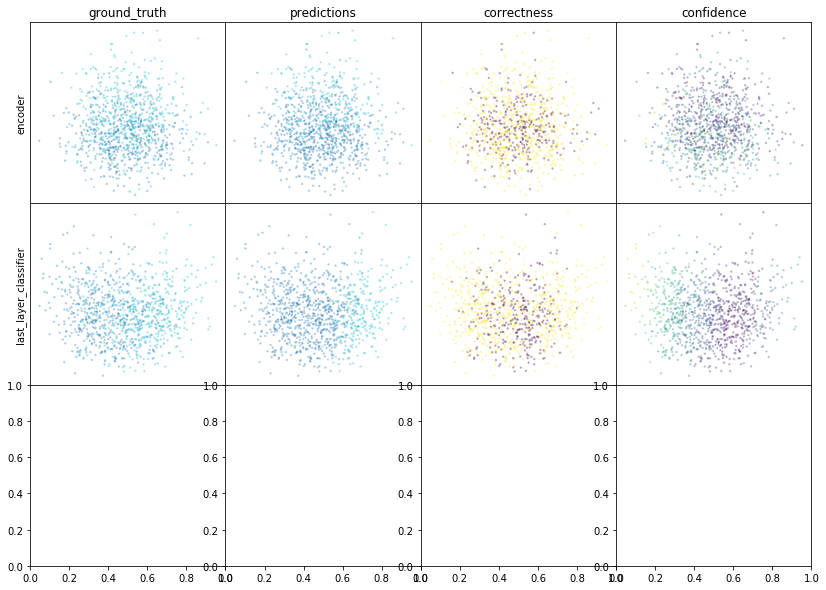

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:115: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:128: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:143: UserWarning: Data has no positive values, and therefore cannot be log-scaled.


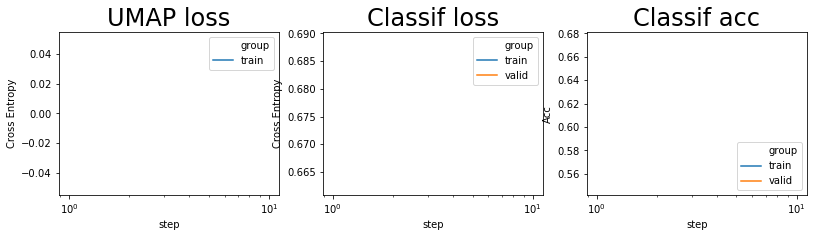

batch: 0 | train acc: 0.548 | val acc: 0.675
saving weights | batch = 100 | acc = 76.201


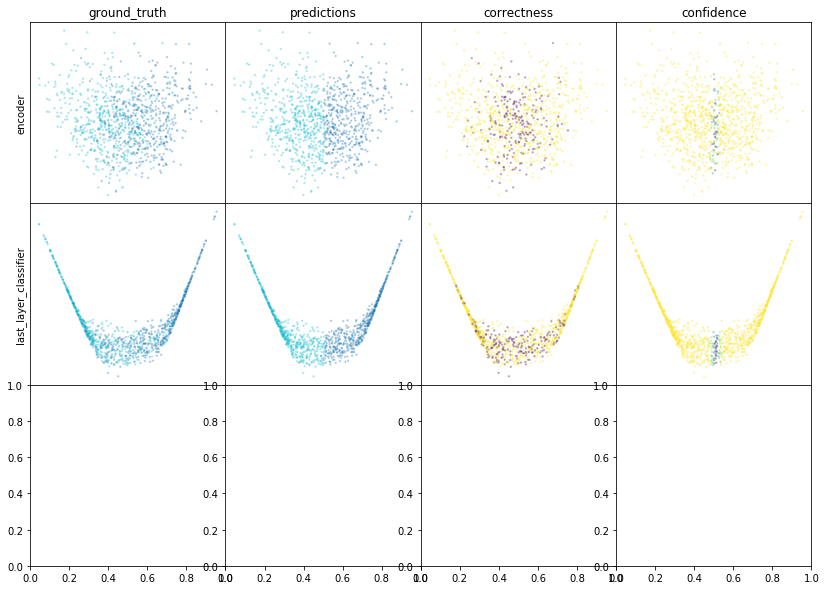

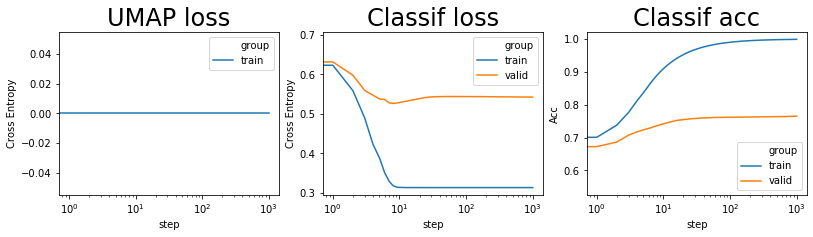

batch: 1000 | train acc: 0.999 | val acc: 0.7652


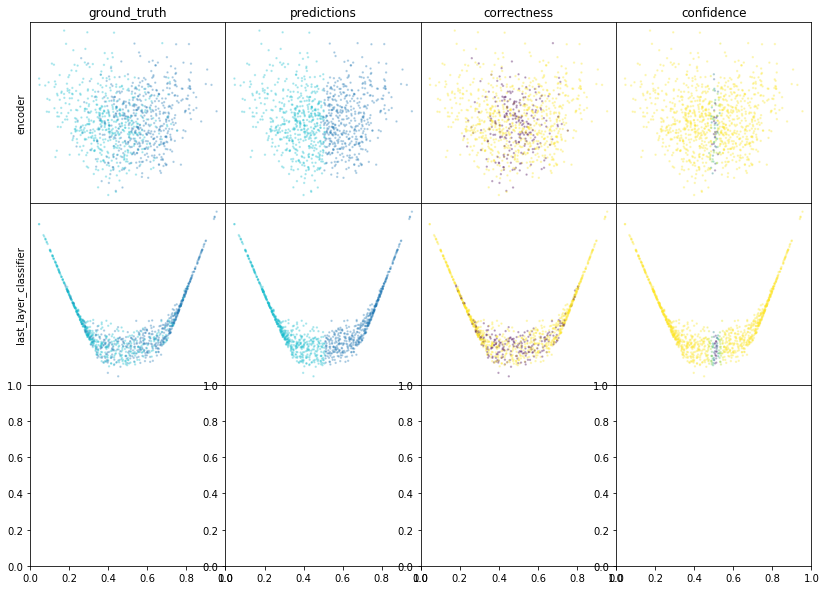

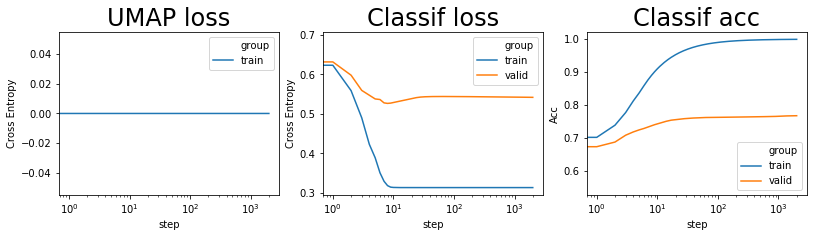

batch: 2000 | train acc: 0.9995 | val acc: 0.7669
saving weights | batch = 2308 | acc = 76.701


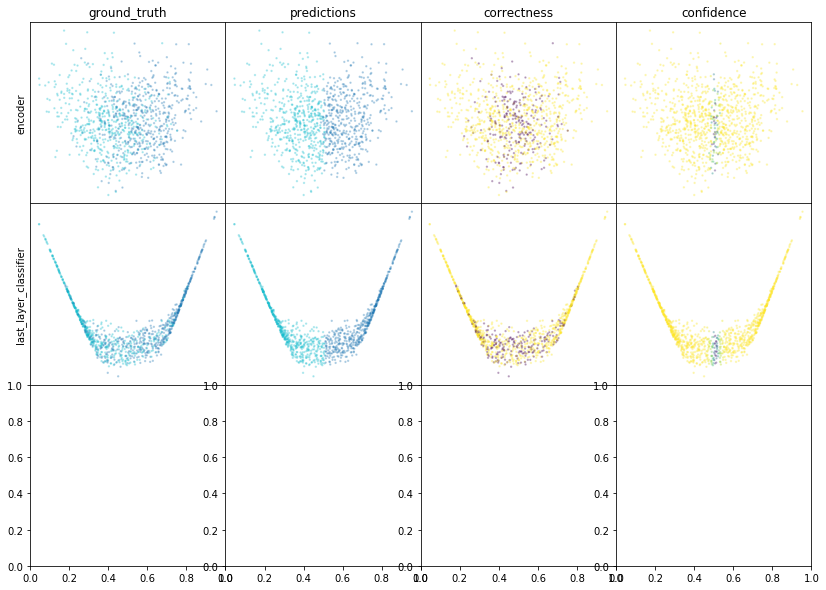

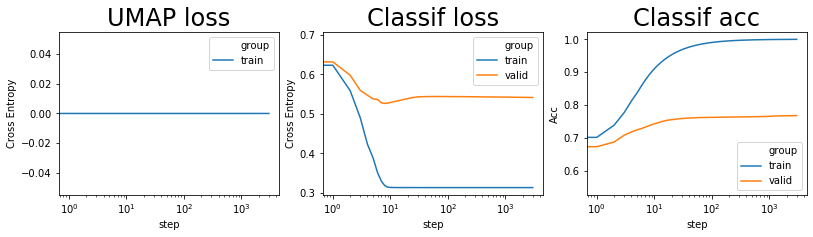

batch: 3000 | train acc: 0.9997 | val acc: 0.7672


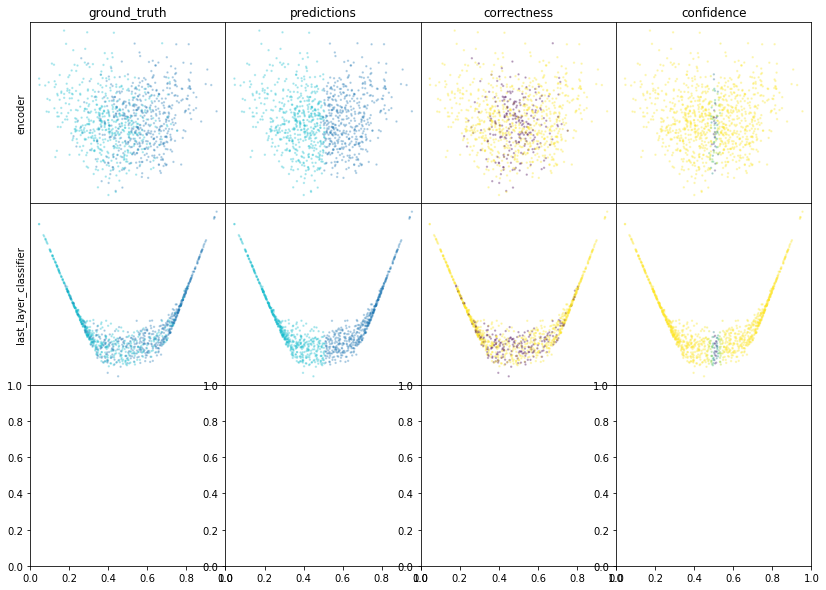

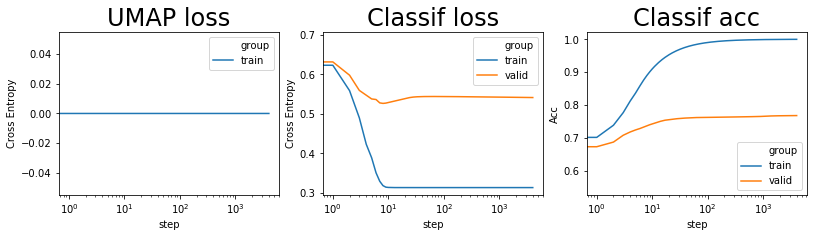

batch: 4000 | train acc: 0.9998 | val acc: 0.7674


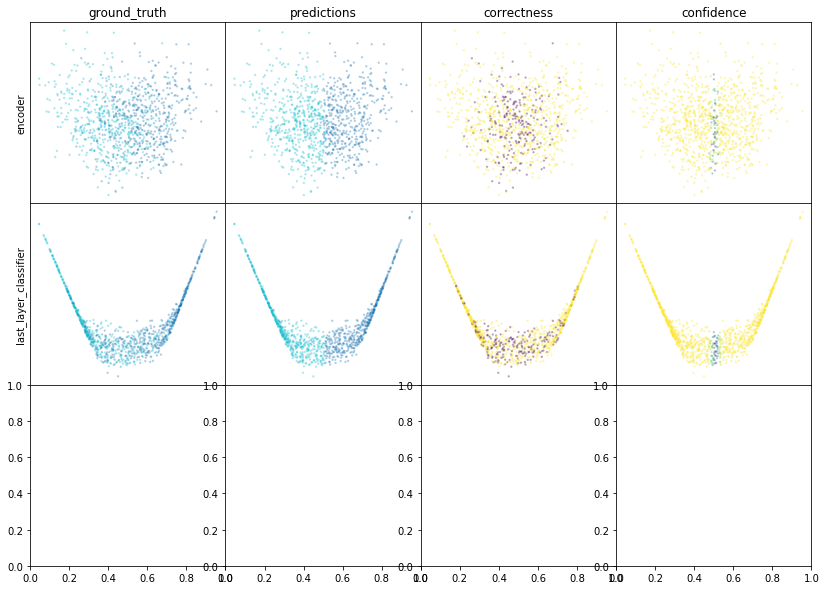

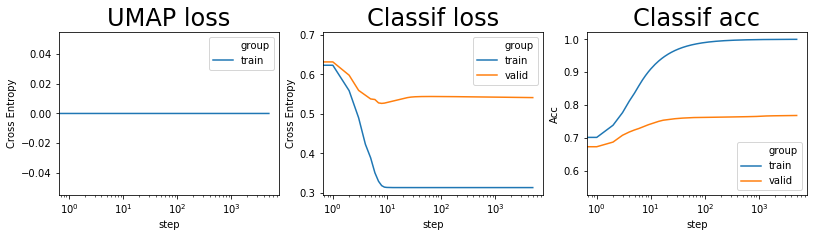

batch: 5000 | train acc: 0.9998 | val acc: 0.7677


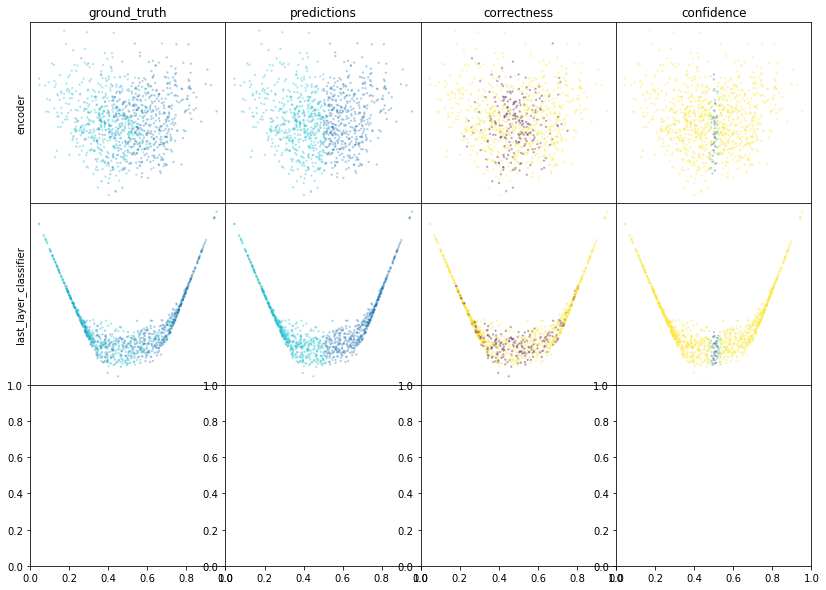

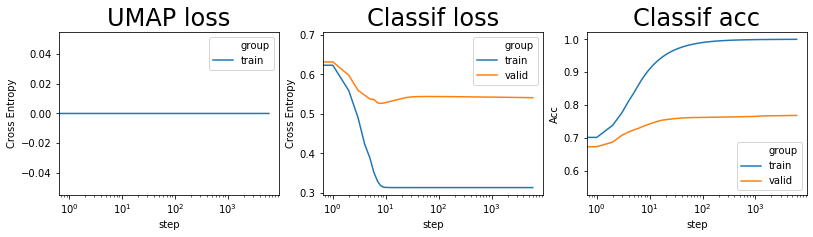

batch: 6000 | train acc: 0.9998 | val acc: 0.7679


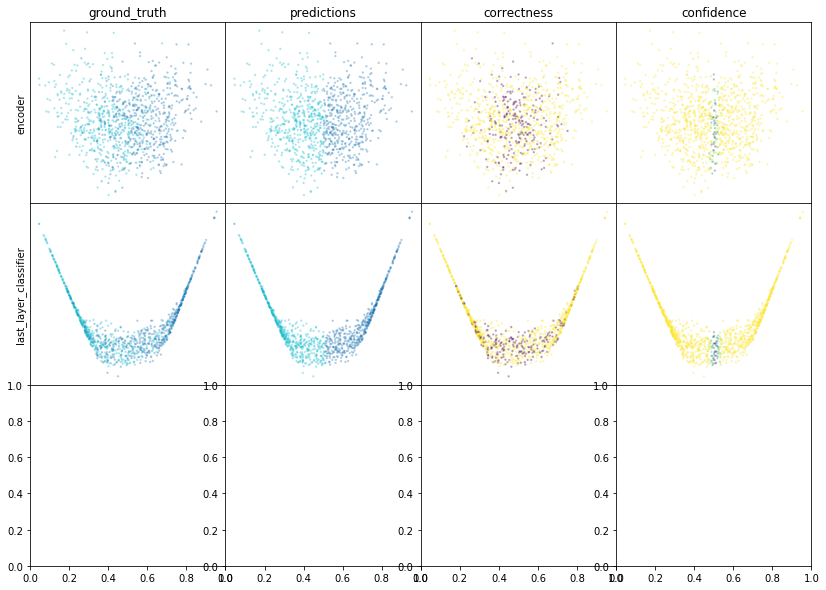

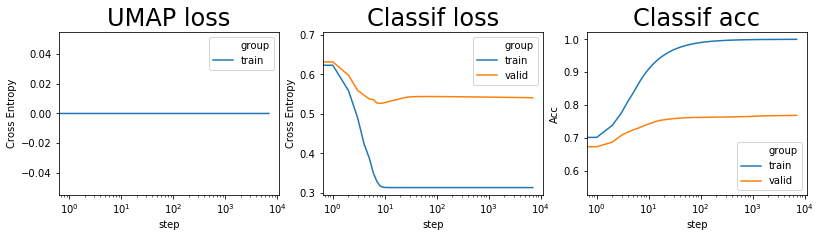

batch: 7000 | train acc: 0.9999 | val acc: 0.7681


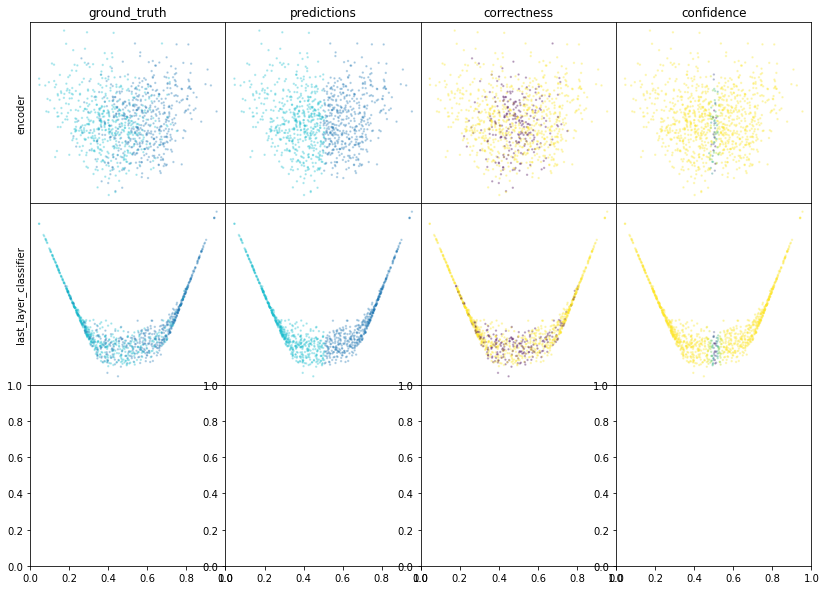

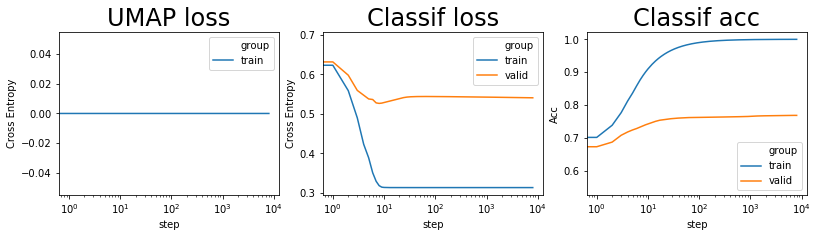

batch: 8000 | train acc: 0.9999 | val acc: 0.768


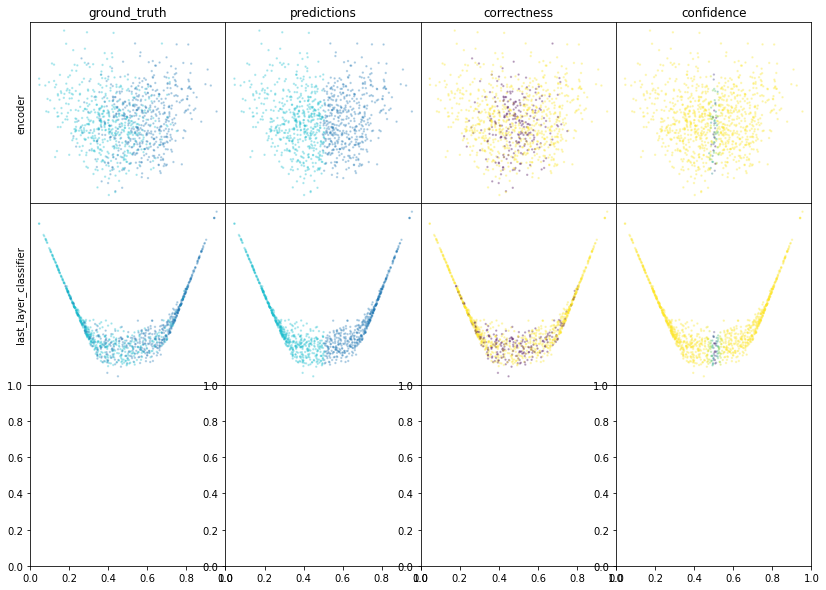

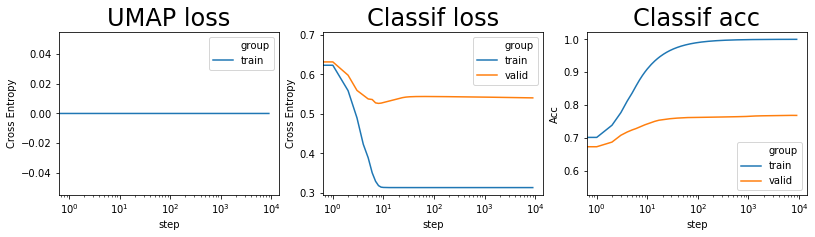

batch: 9000 | train acc: 0.9999 | val acc: 0.768


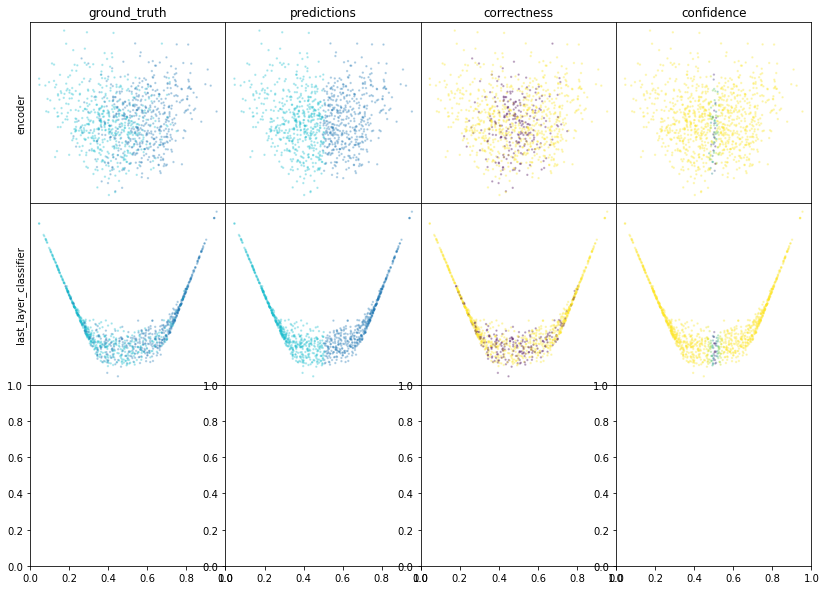

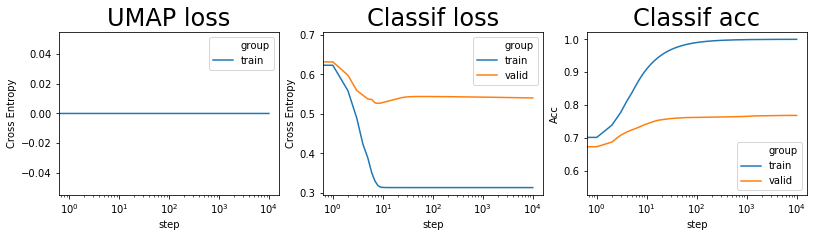

batch: 10000 | train acc: 0.9999 | val acc: 0.7679


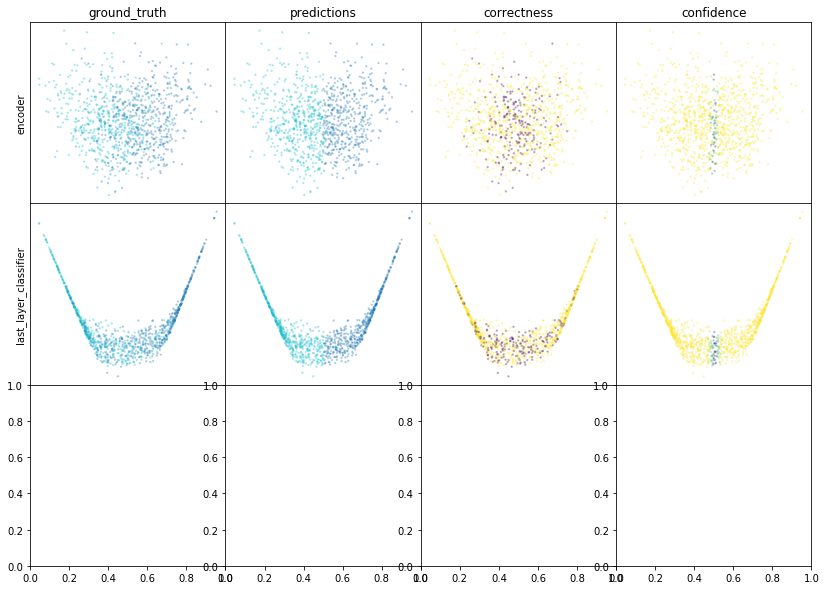

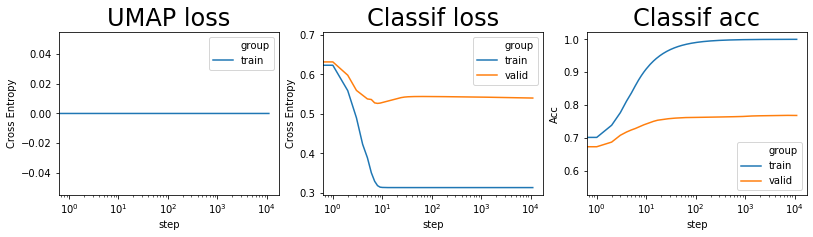

batch: 11000 | train acc: 0.9999 | val acc: 0.7679


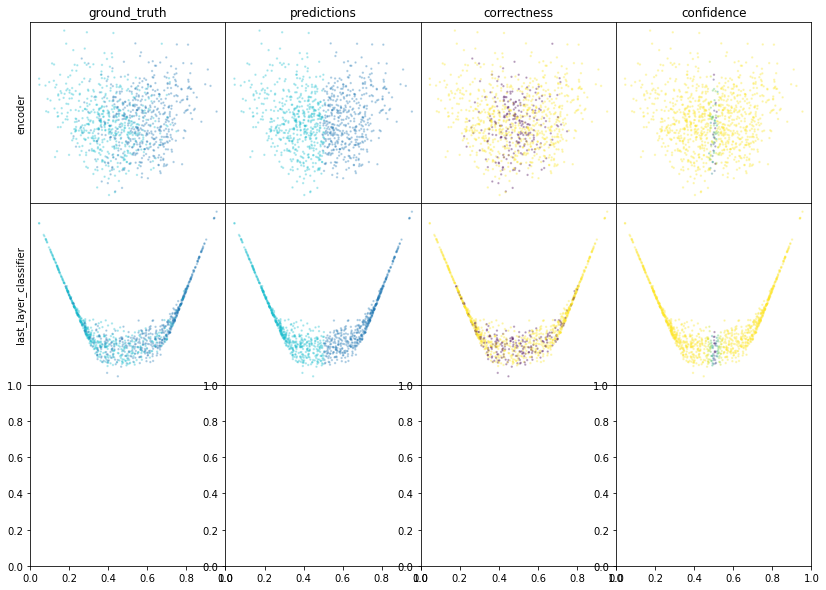

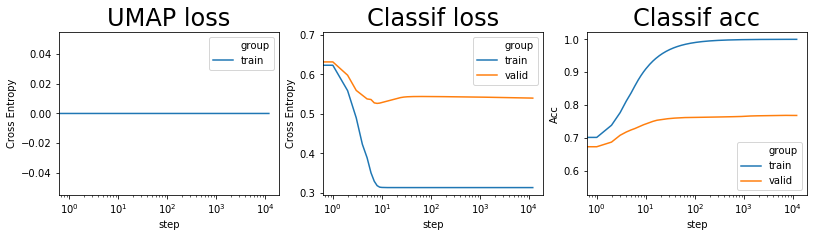

batch: 12000 | train acc: 0.9999 | val acc: 0.7679


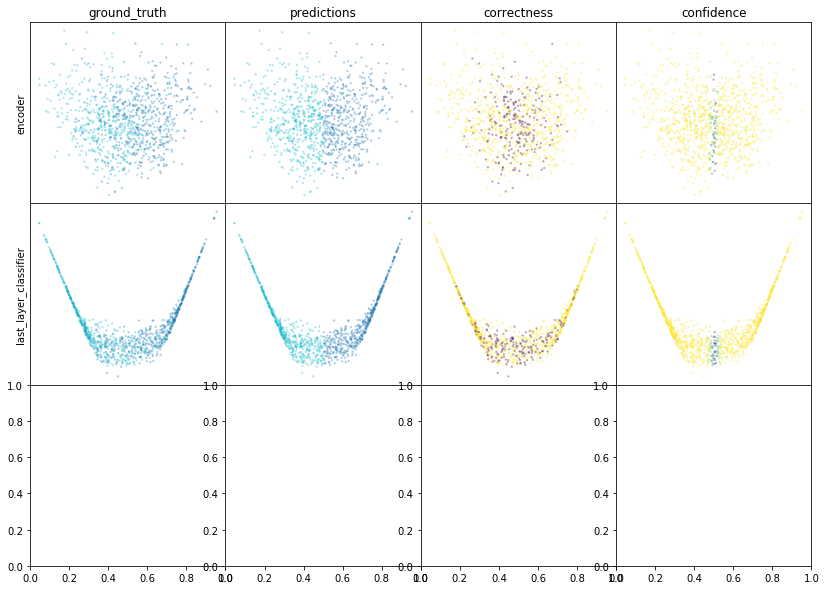

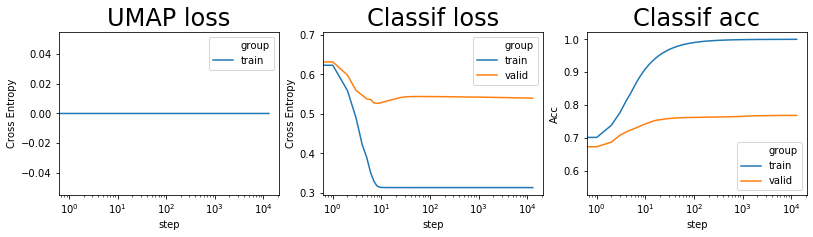

batch: 13000 | train acc: 0.9999 | val acc: 0.768


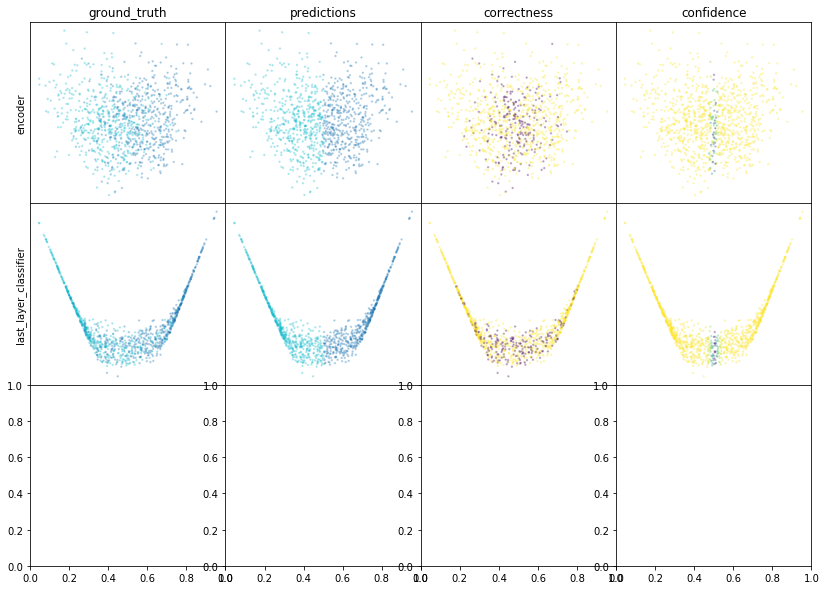

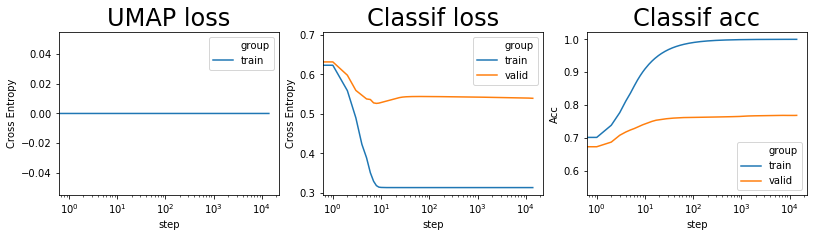

batch: 14000 | train acc: 0.9999 | val acc: 0.7681


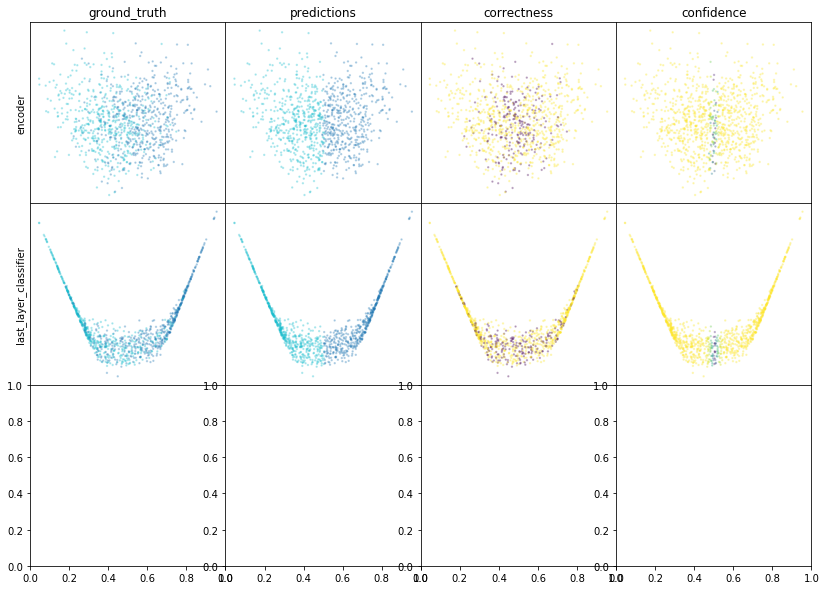

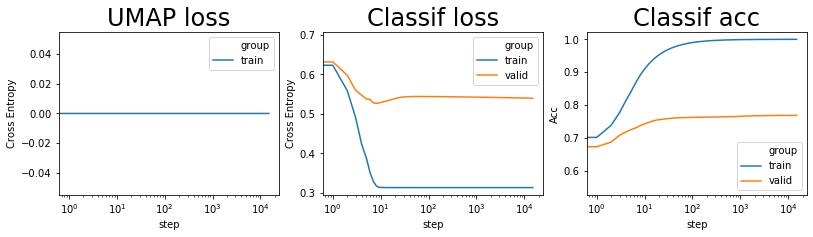

batch: 15000 | train acc: 0.9999 | val acc: 0.7683


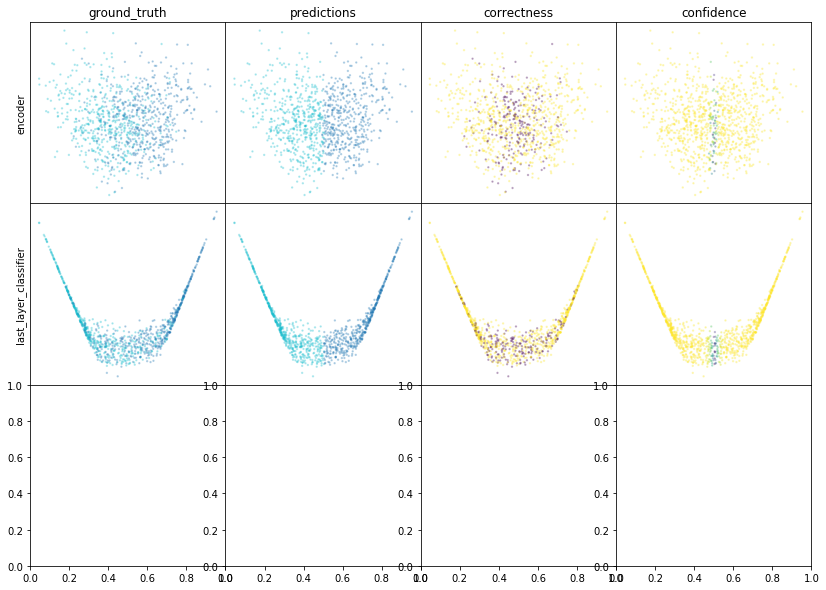

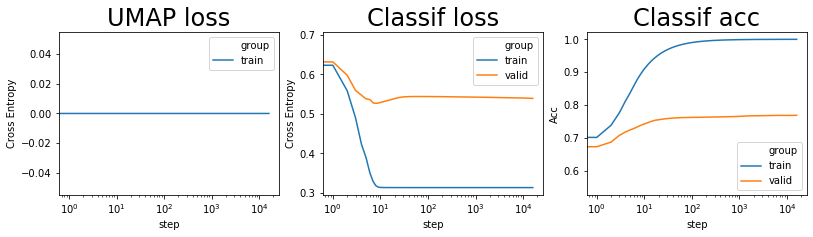

batch: 16000 | train acc: 0.9999 | val acc: 0.7684


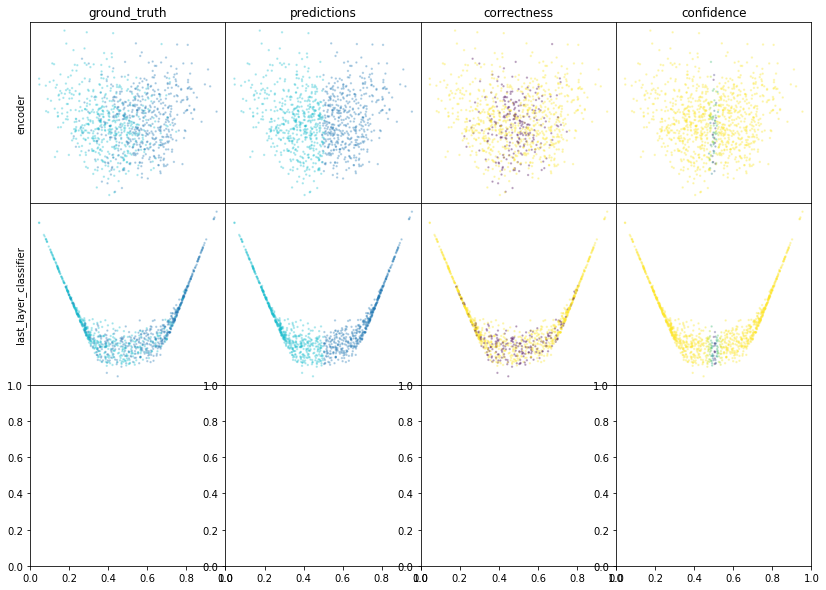

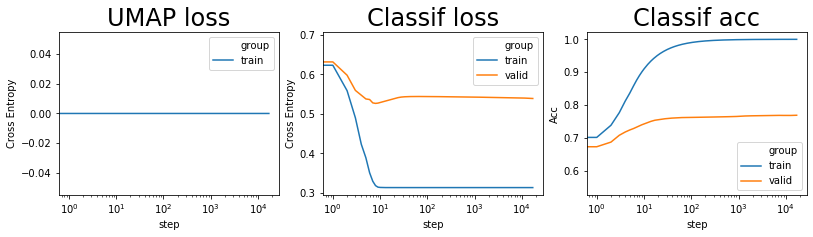

batch: 17000 | train acc: 0.9999 | val acc: 0.7685


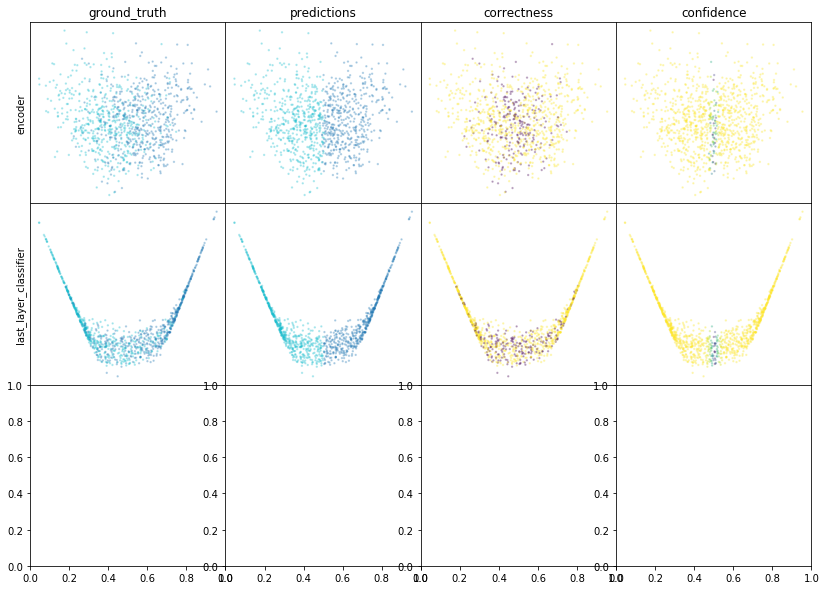

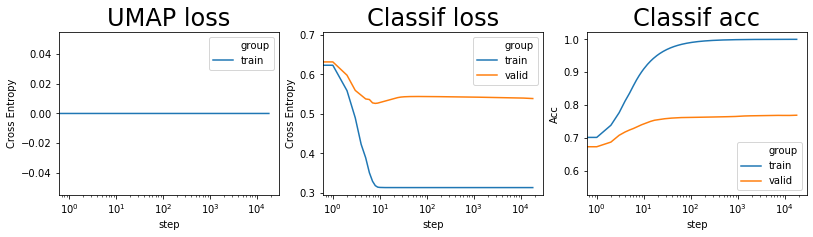

batch: 18000 | train acc: 0.9999 | val acc: 0.7686


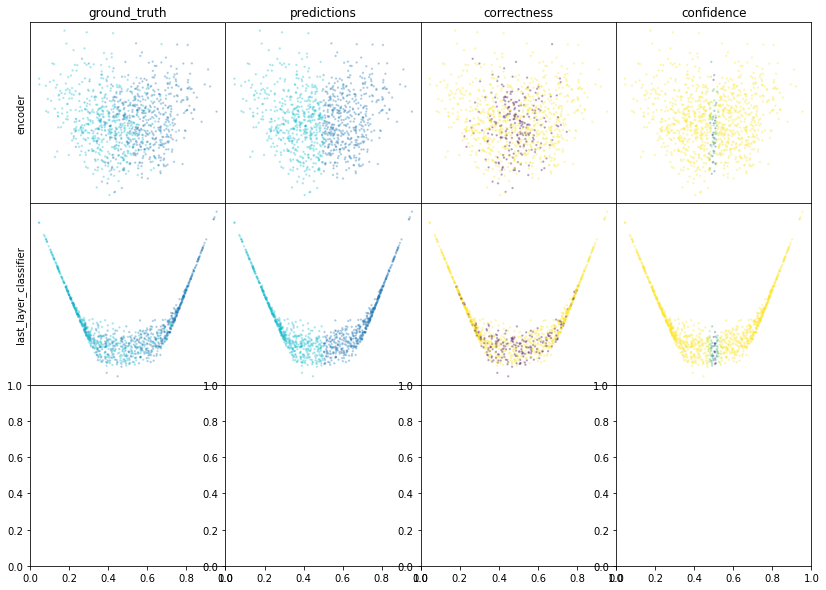

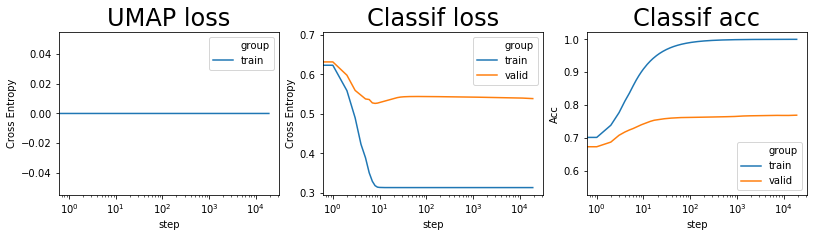

batch: 19000 | train acc: 0.9999 | val acc: 0.7687


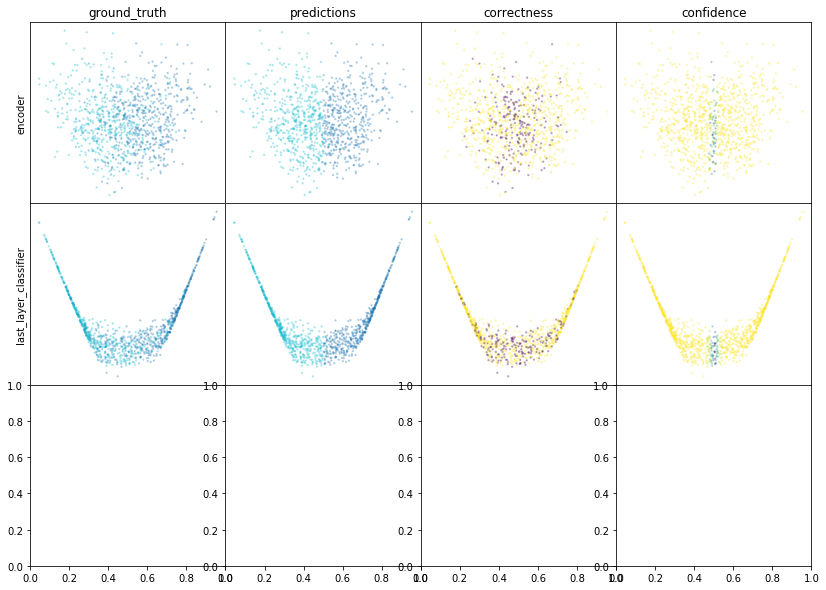

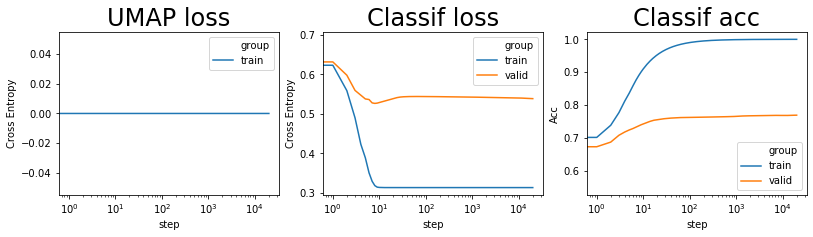

batch: 20000 | train acc: 1.0 | val acc: 0.7687


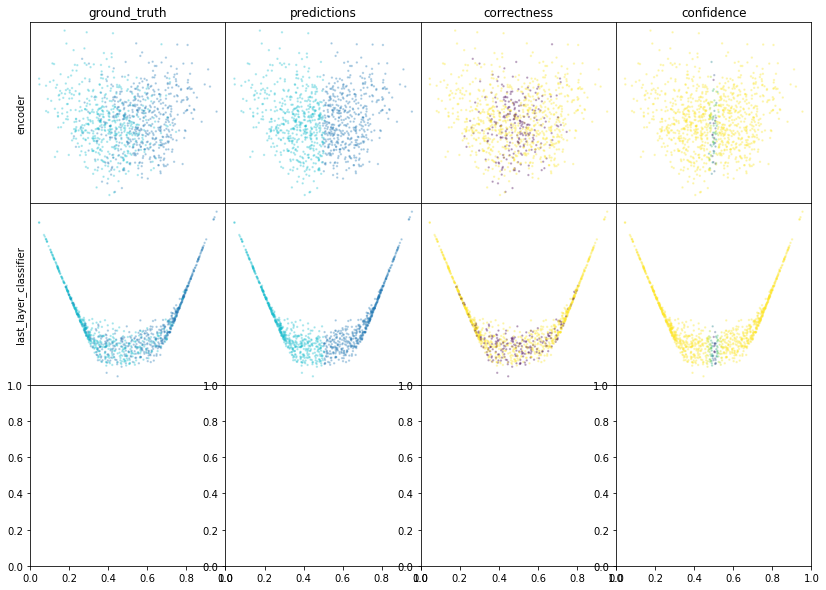

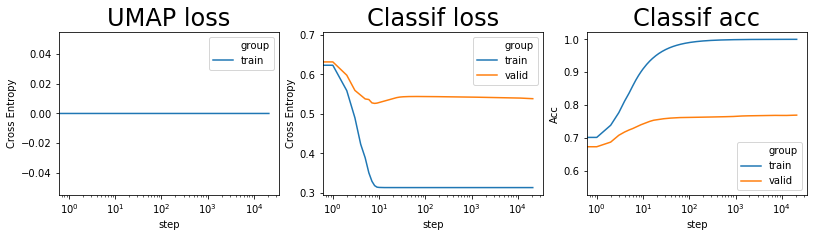

batch: 21000 | train acc: 1.0 | val acc: 0.7688


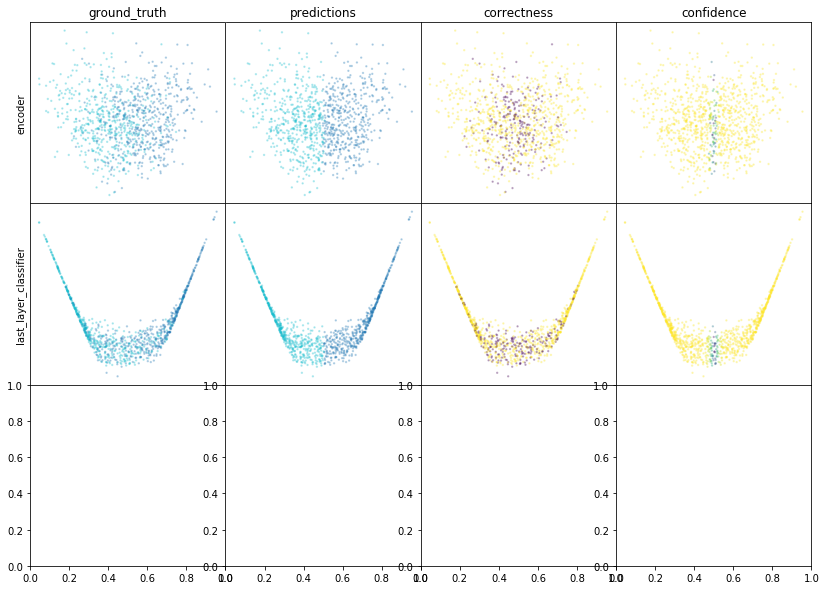

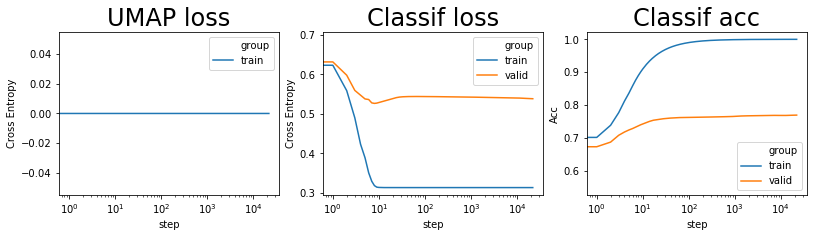

batch: 22000 | train acc: 1.0 | val acc: 0.7689


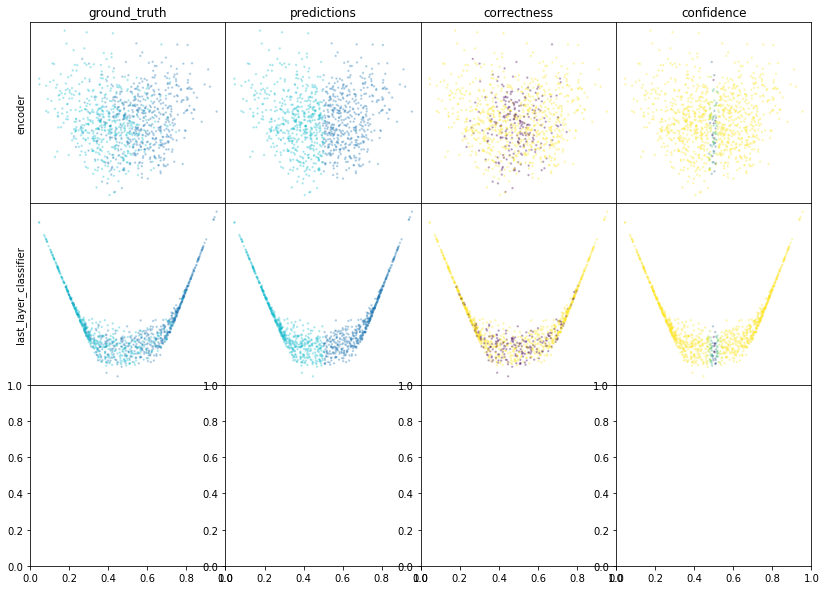

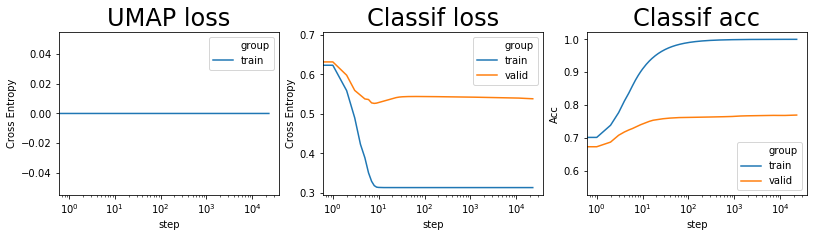

batch: 23000 | train acc: 1.0 | val acc: 0.7691


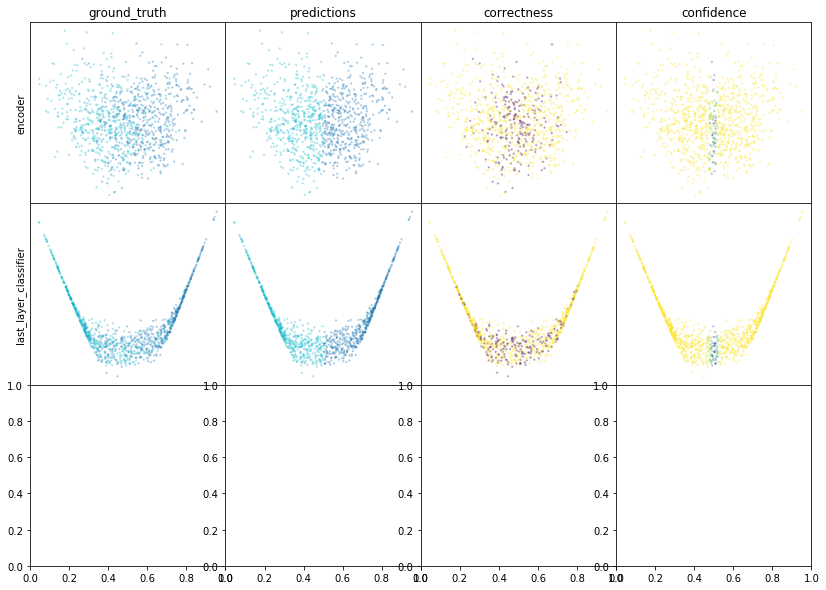

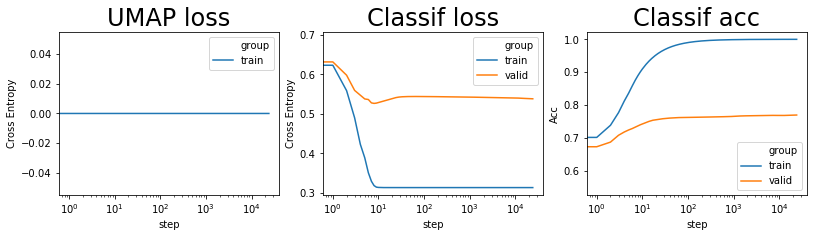

batch: 24000 | train acc: 1.0 | val acc: 0.7692


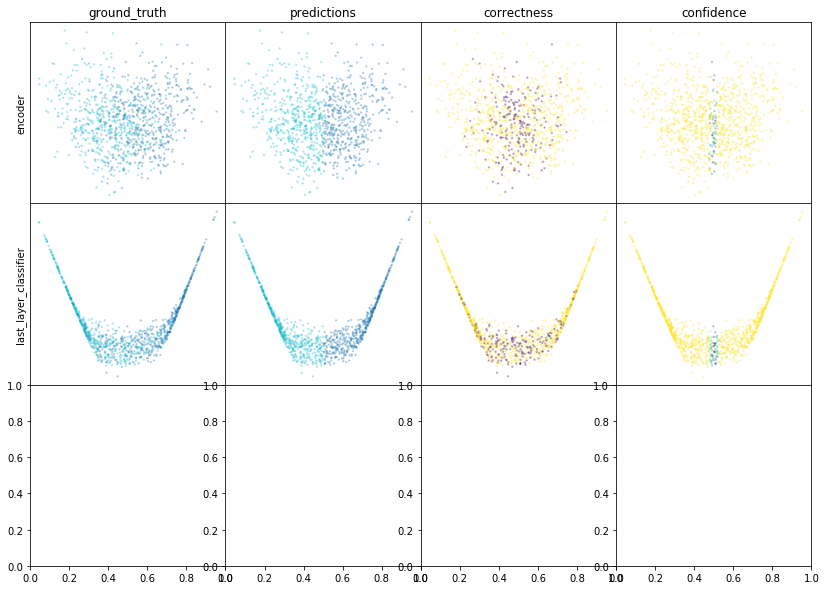

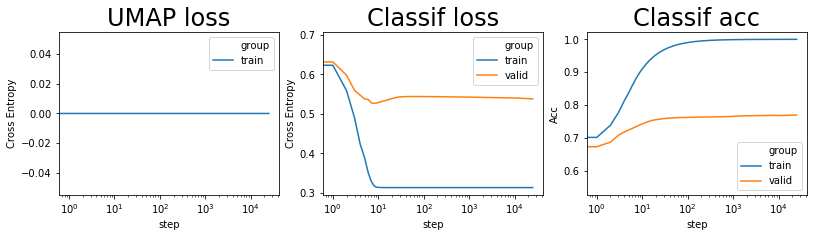

batch: 25000 | train acc: 1.0 | val acc: 0.7693


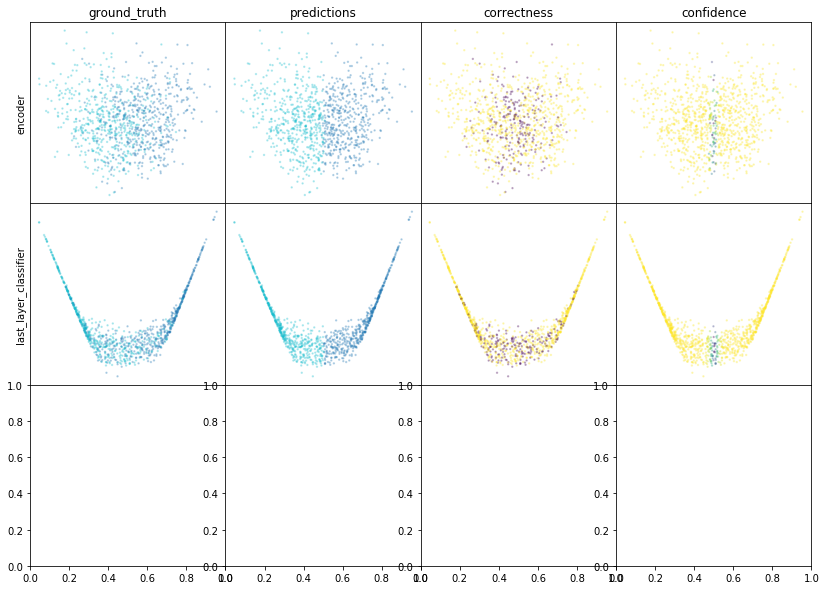

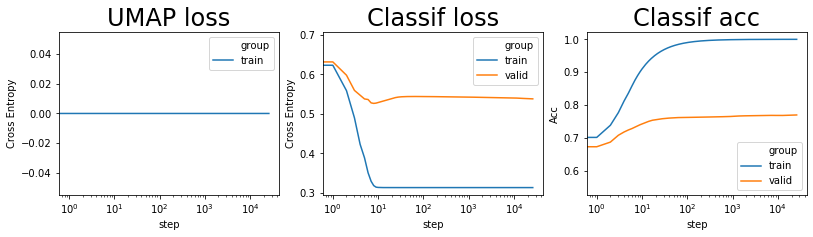

batch: 26000 | train acc: 1.0 | val acc: 0.7694


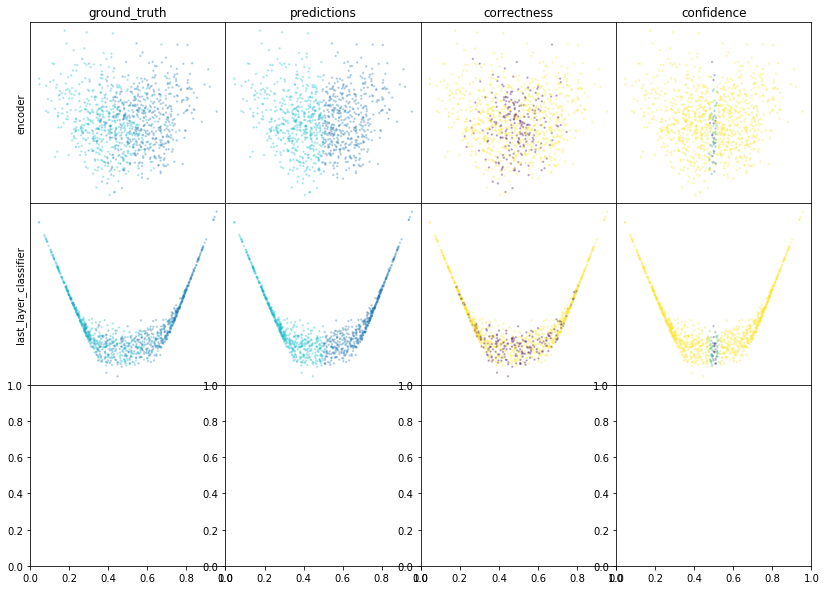

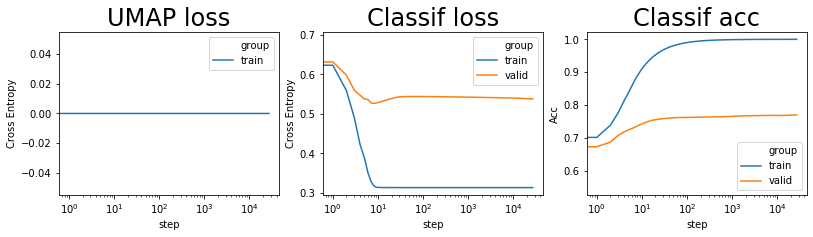

batch: 27000 | train acc: 1.0 | val acc: 0.7695


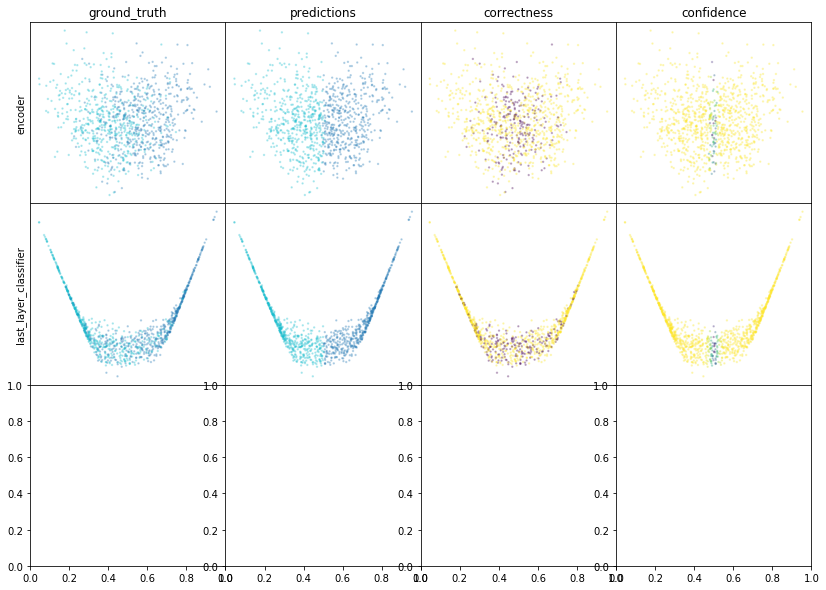

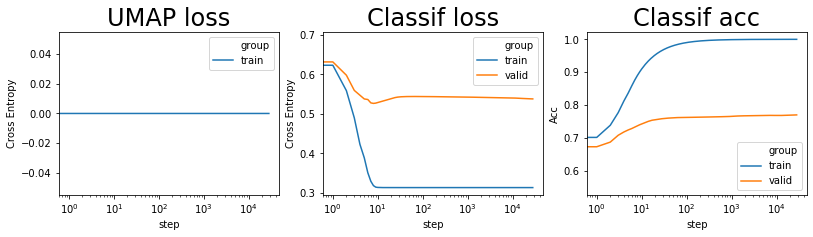

batch: 28000 | train acc: 1.0 | val acc: 0.7696


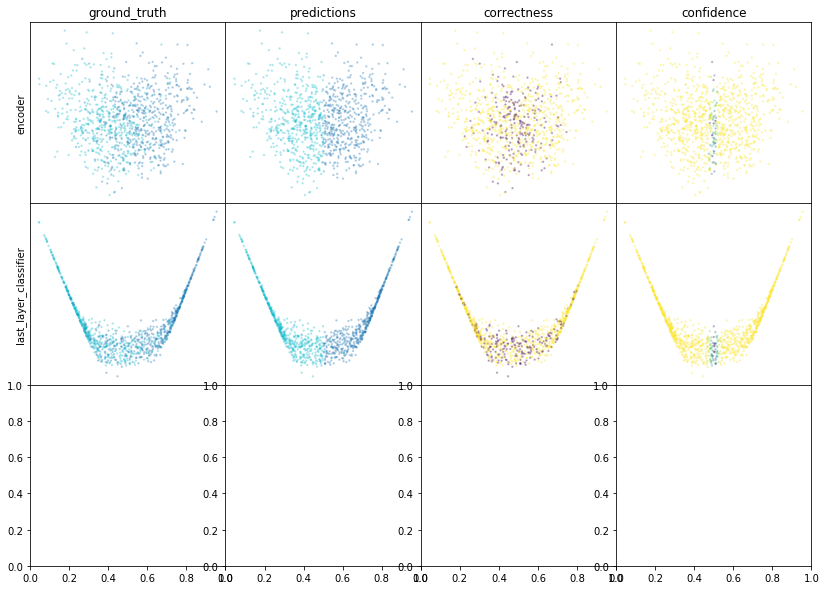

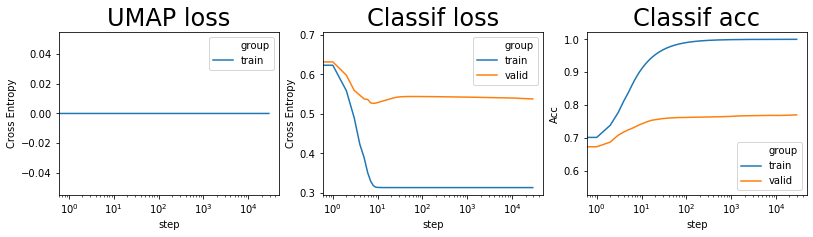

batch: 29000 | train acc: 1.0 | val acc: 0.7697


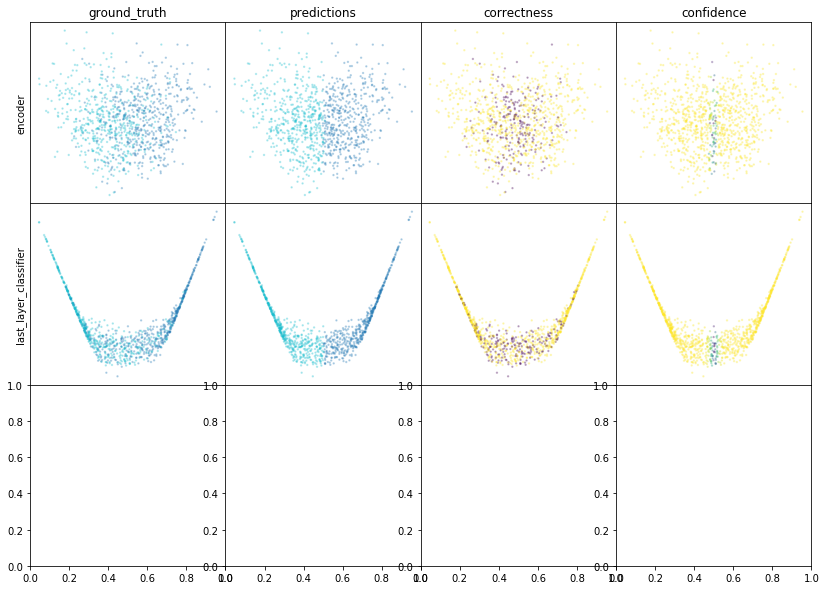

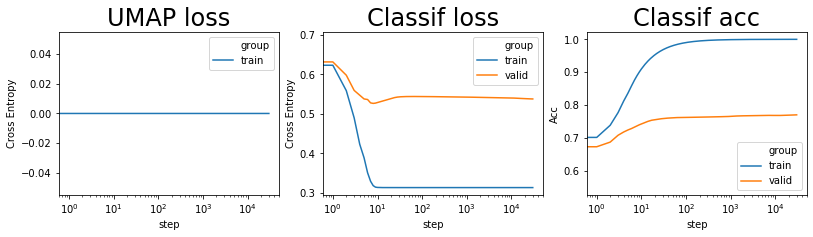

batch: 30000 | train acc: 1.0 | val acc: 0.7698


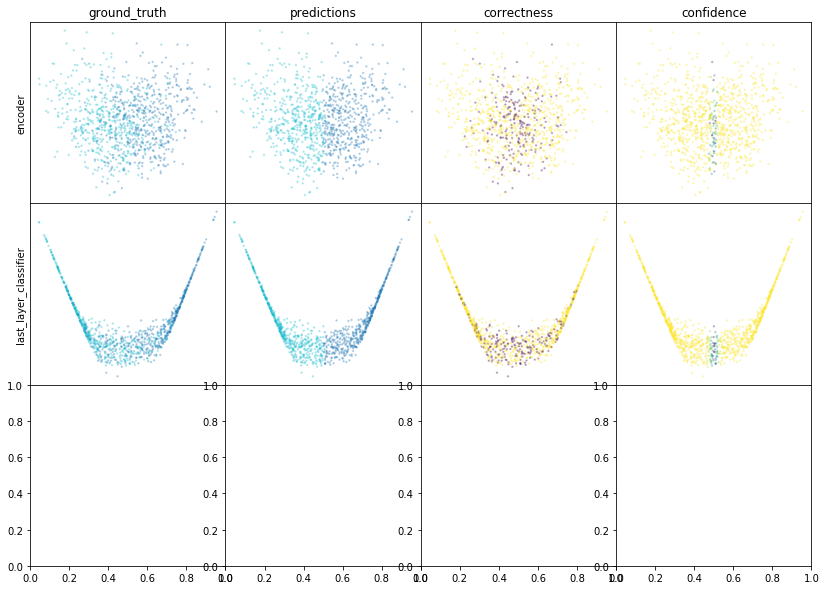

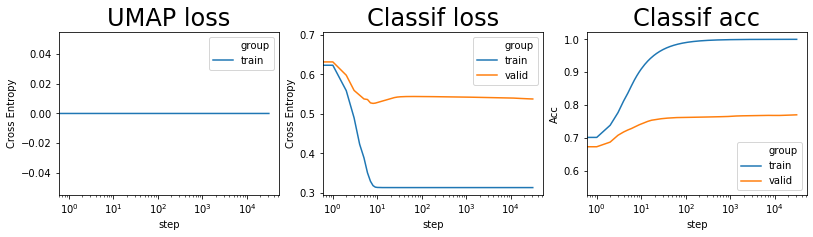

batch: 31000 | train acc: 1.0 | val acc: 0.7698


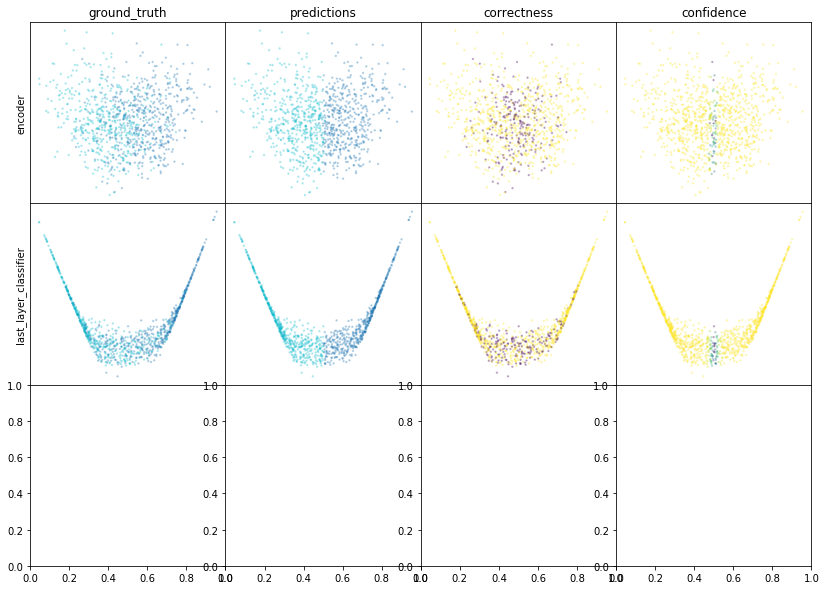

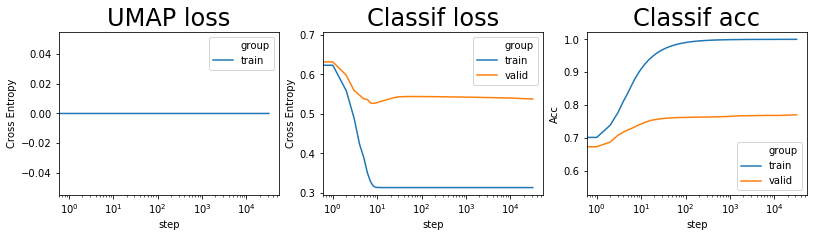

batch: 32000 | train acc: 1.0 | val acc: 0.7699


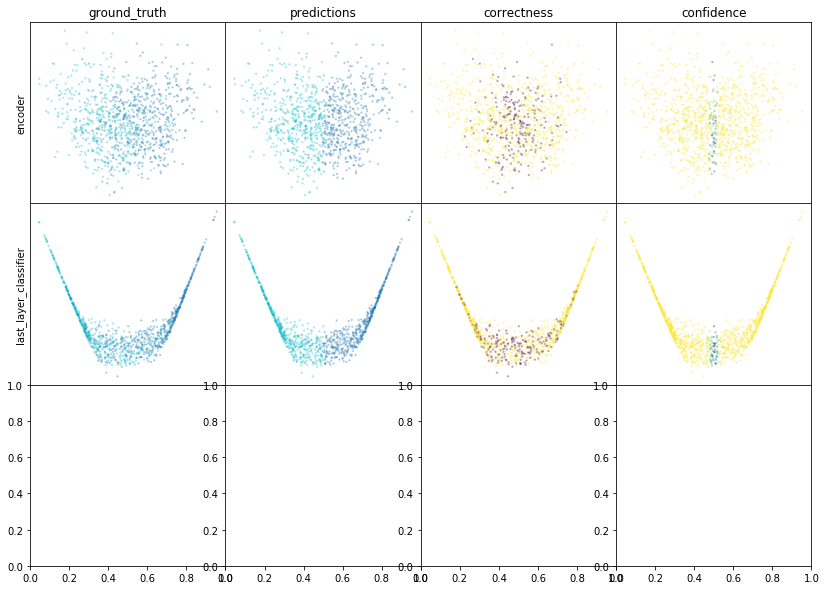

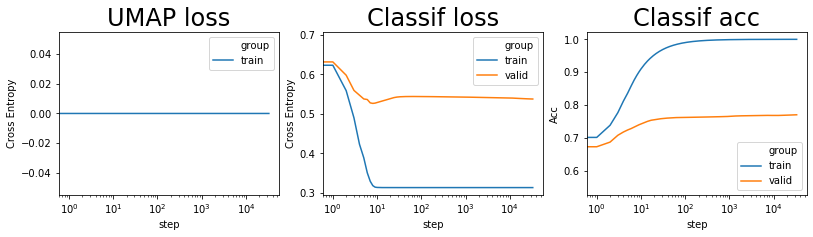

batch: 33000 | train acc: 1.0 | val acc: 0.77


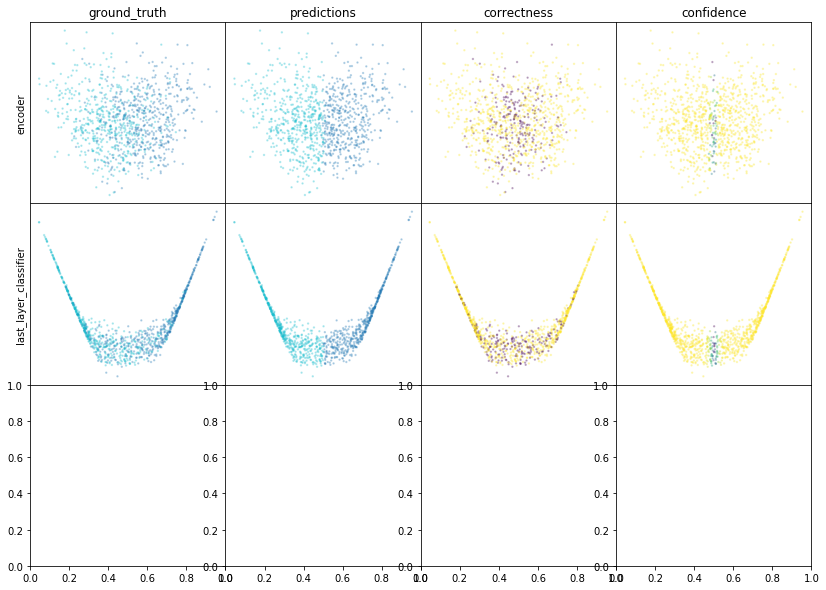

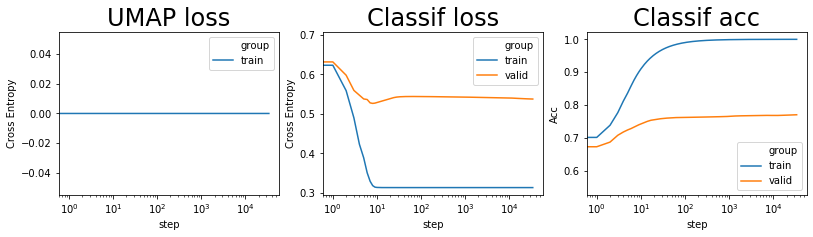

batch: 34000 | train acc: 1.0 | val acc: 0.77


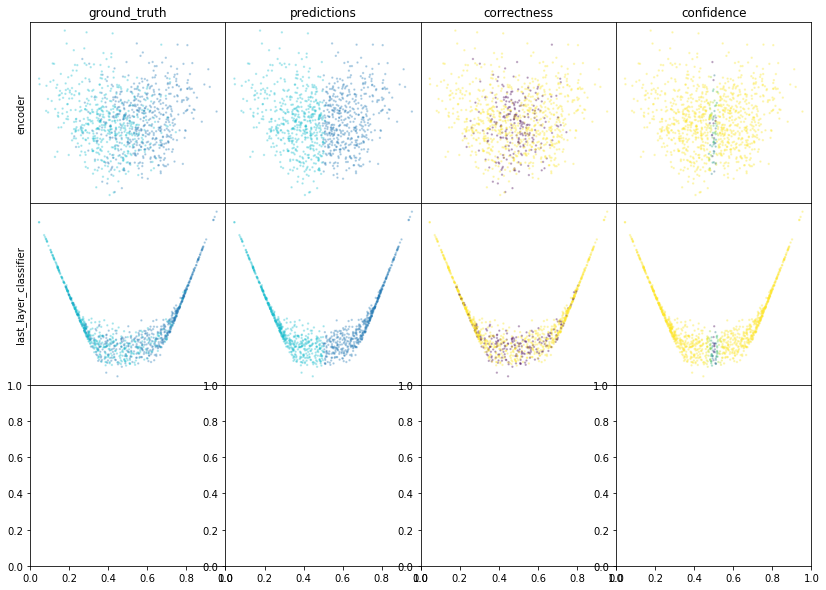

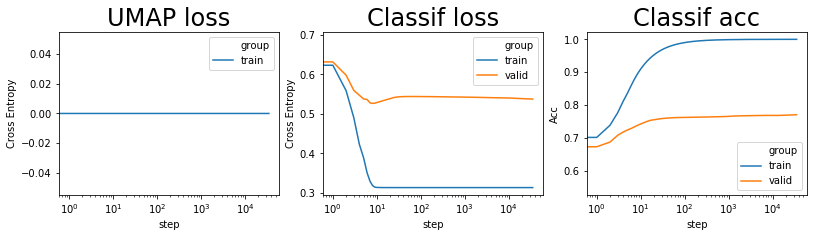

batch: 35000 | train acc: 1.0 | val acc: 0.7701


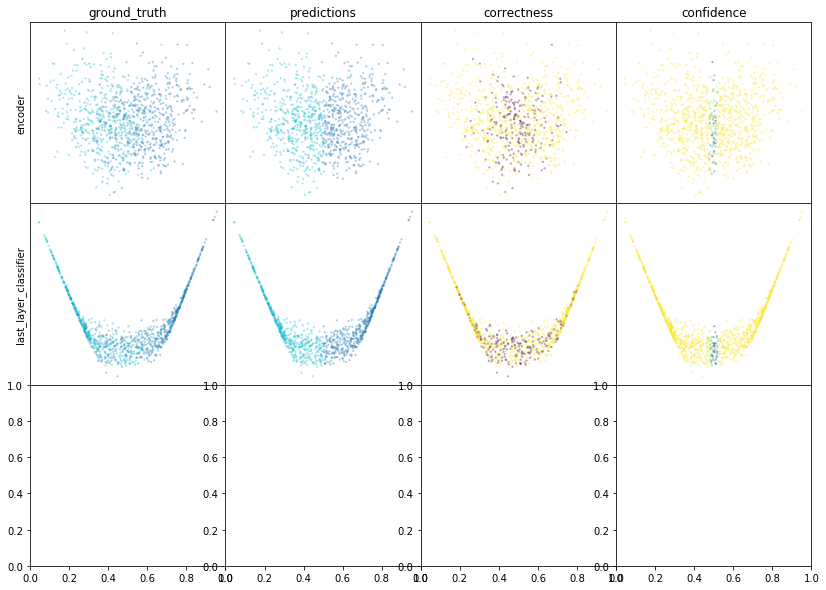

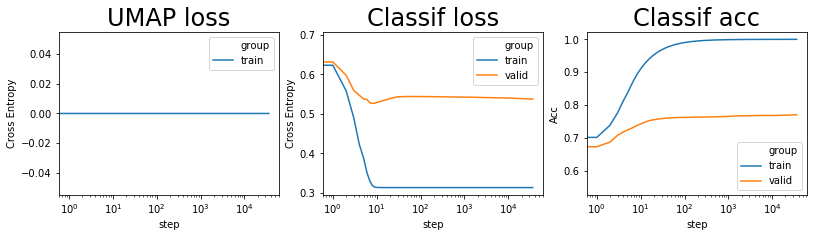

batch: 36000 | train acc: 1.0 | val acc: 0.7701


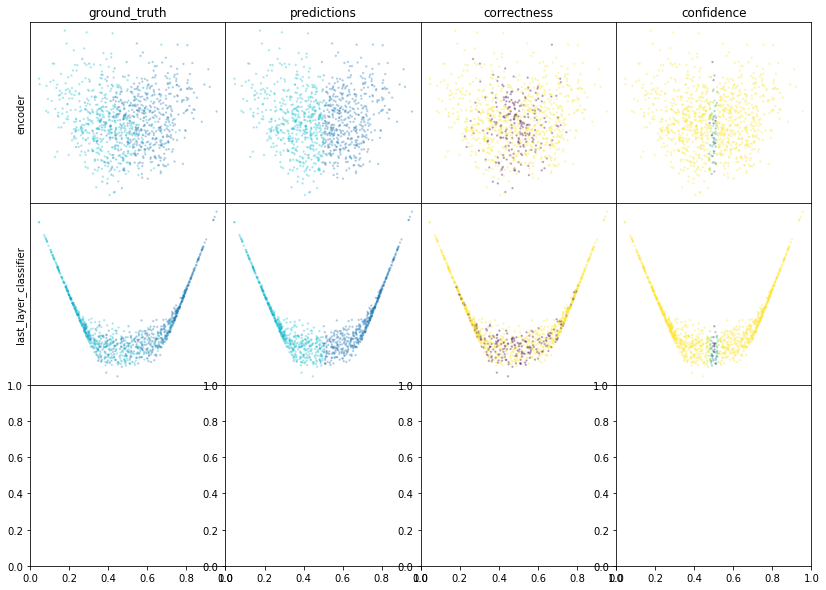

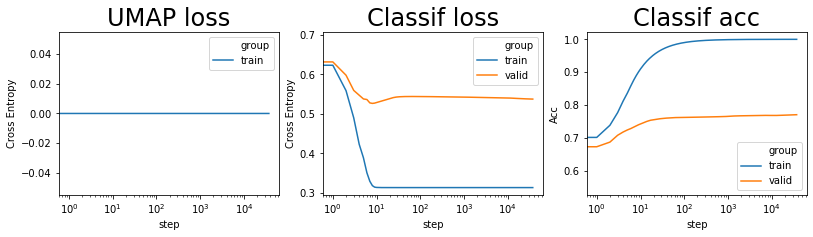

batch: 37000 | train acc: 1.0 | val acc: 0.7702


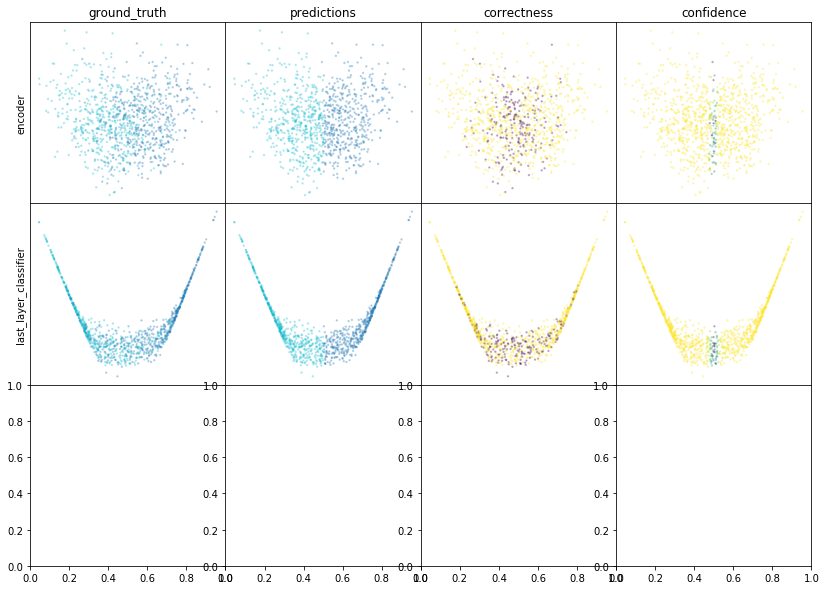

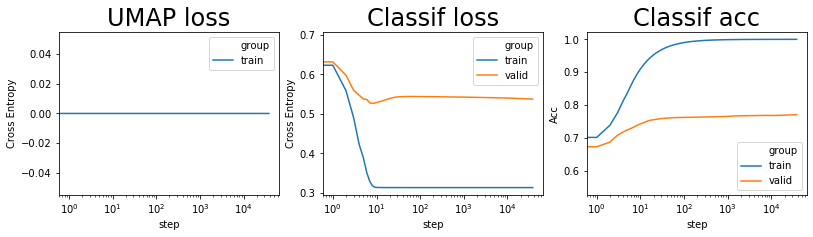

batch: 38000 | train acc: 1.0 | val acc: 0.7702


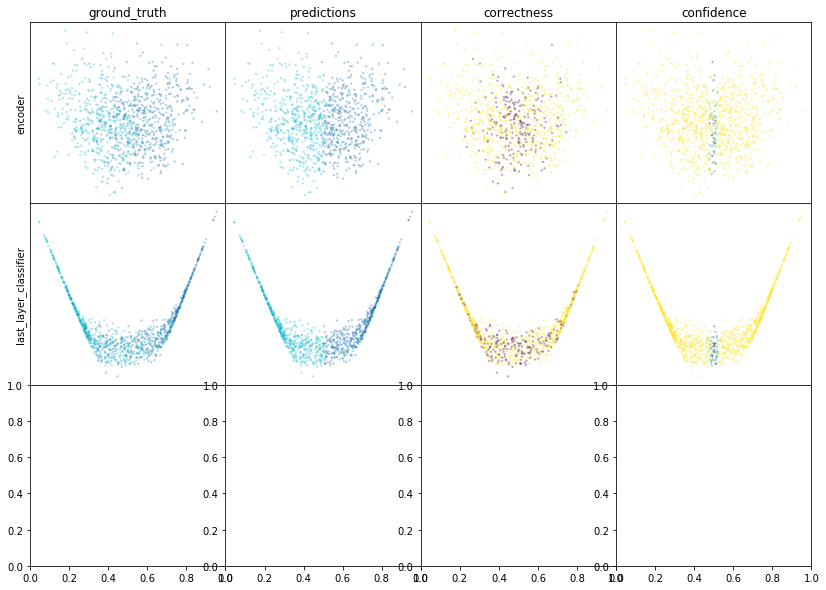

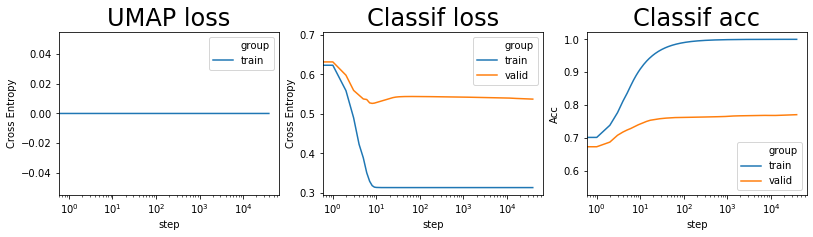

batch: 39000 | train acc: 1.0 | val acc: 0.7703


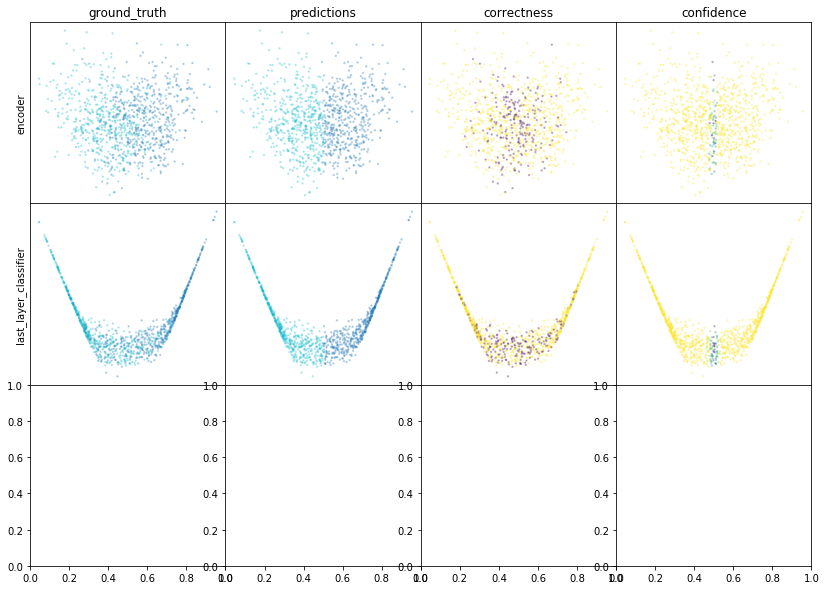

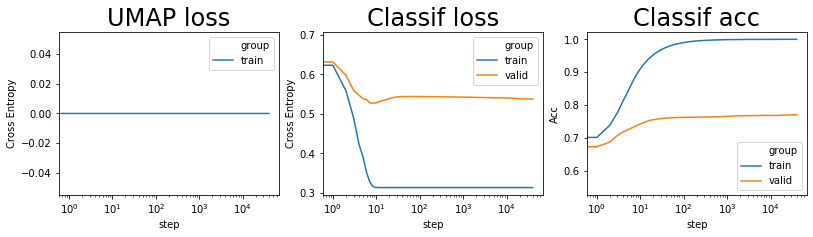

batch: 40000 | train acc: 1.0 | val acc: 0.7703


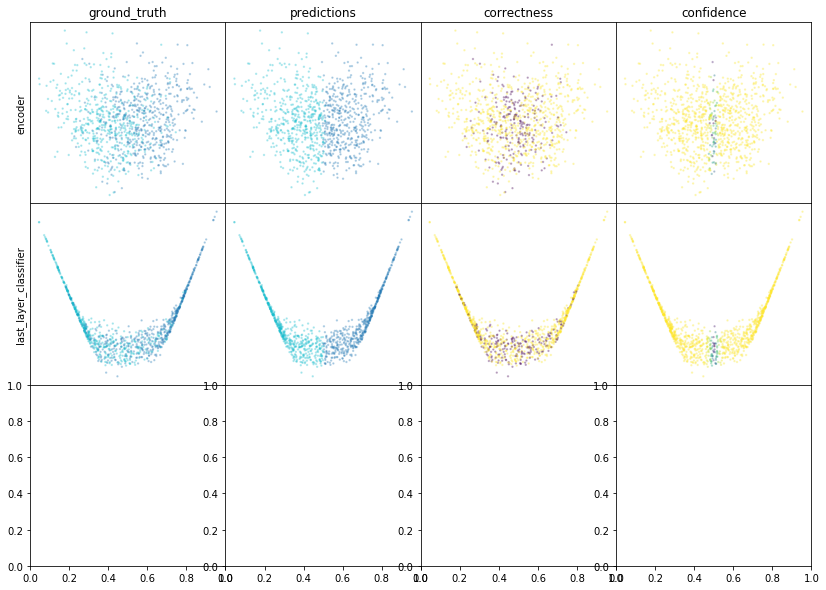

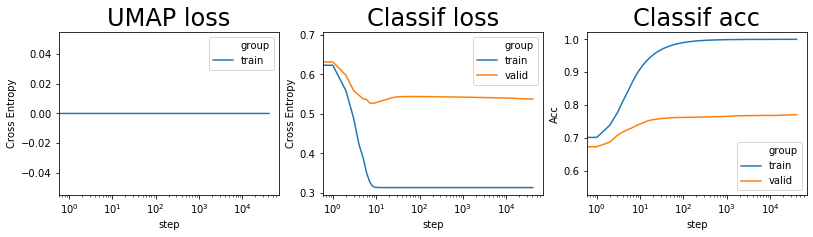

batch: 41000 | train acc: 1.0 | val acc: 0.7704


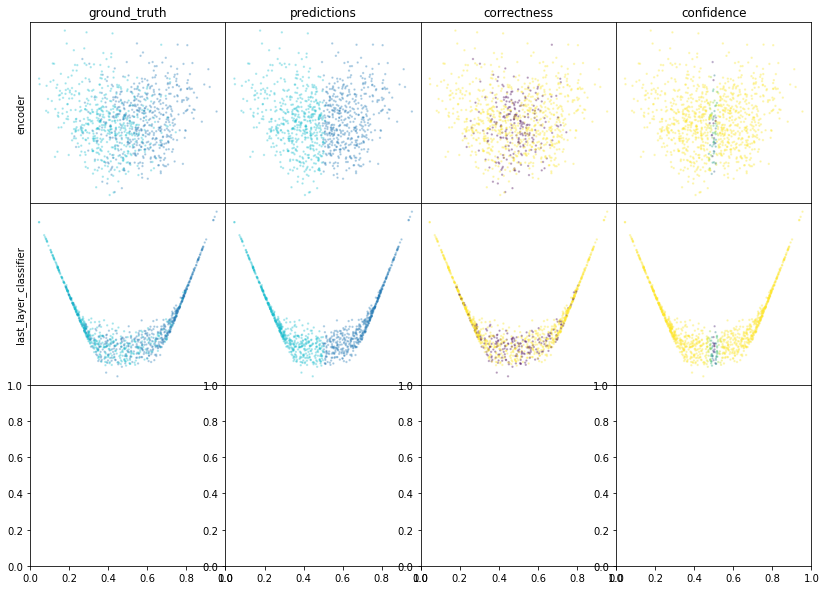

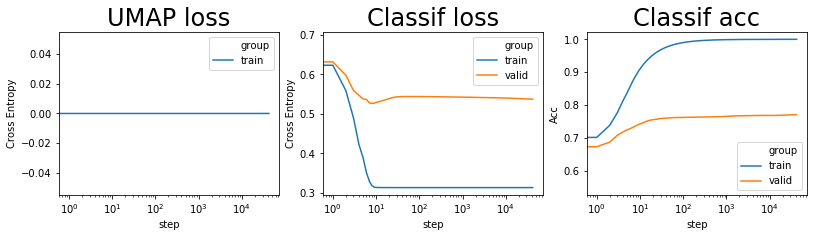

batch: 42000 | train acc: 1.0 | val acc: 0.7704


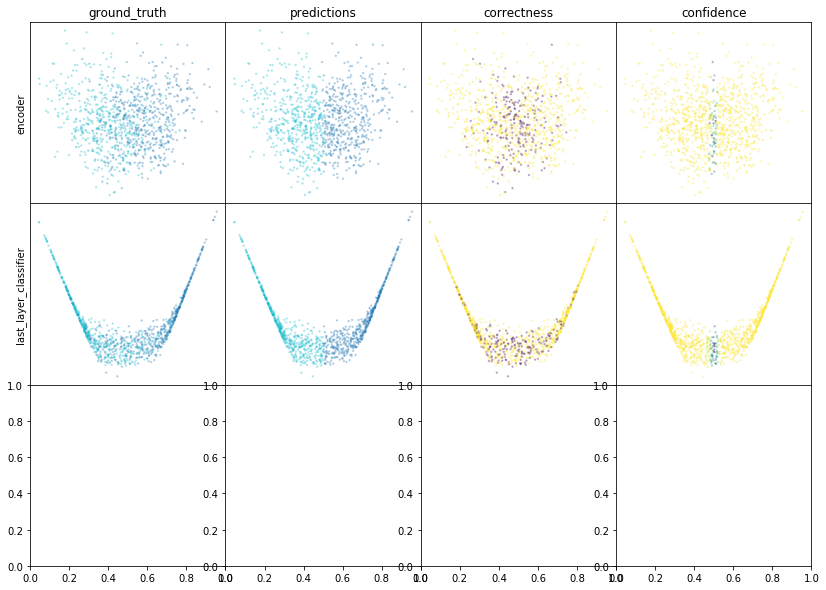

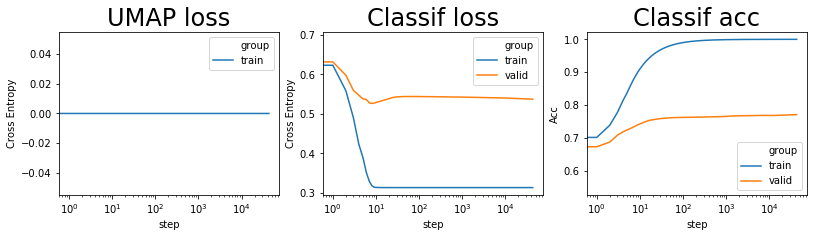

batch: 43000 | train acc: 1.0 | val acc: 0.7704


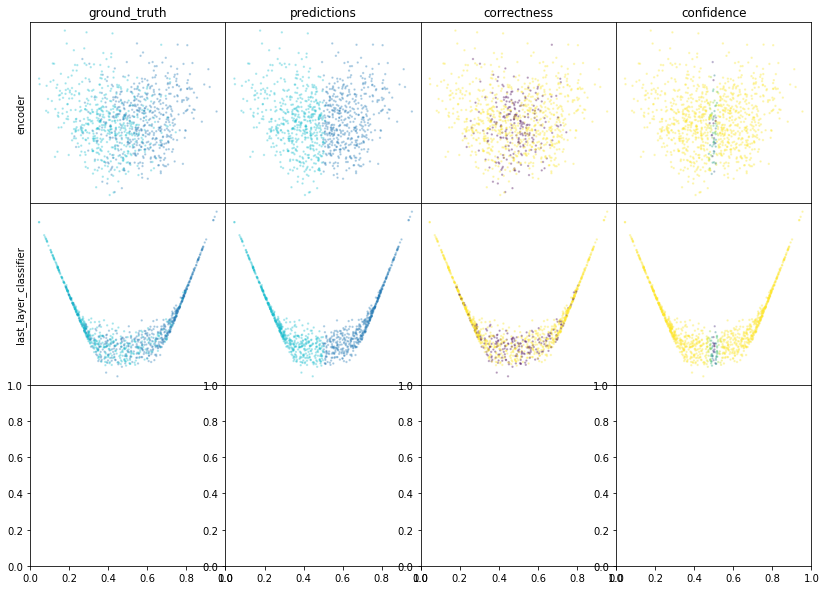

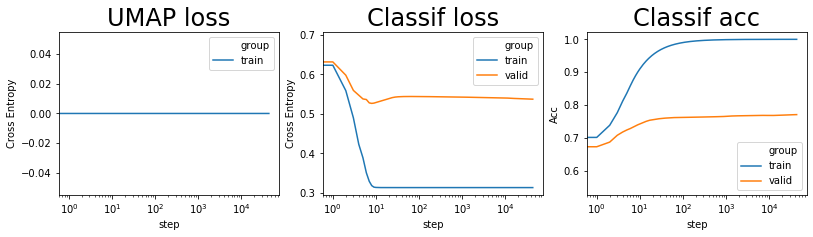

batch: 44000 | train acc: 1.0 | val acc: 0.7705


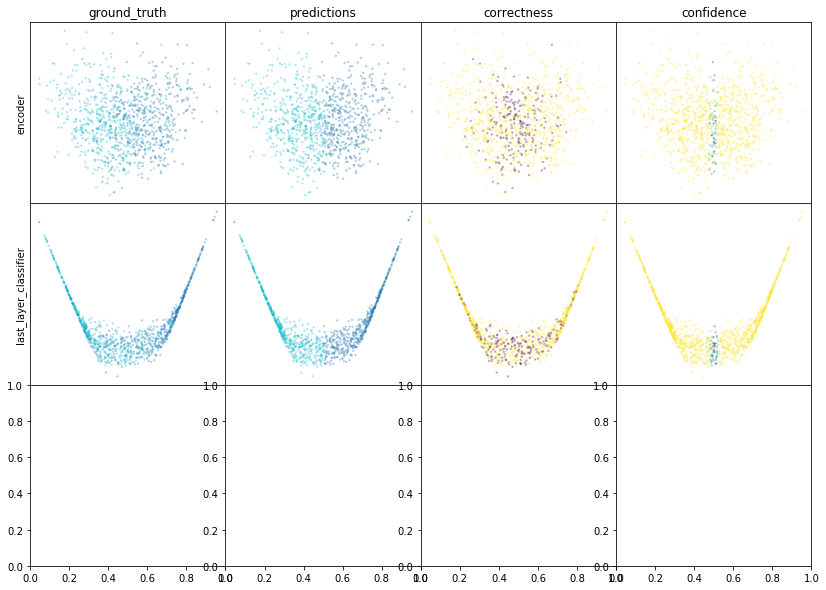

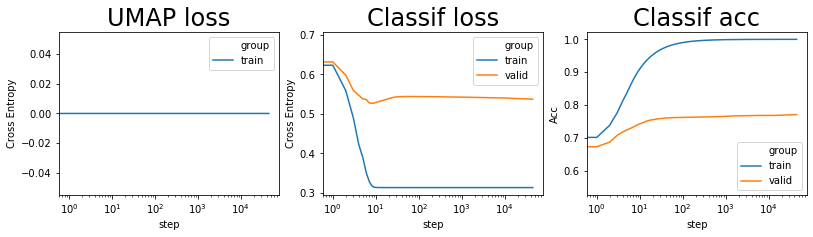

batch: 45000 | train acc: 1.0 | val acc: 0.7705


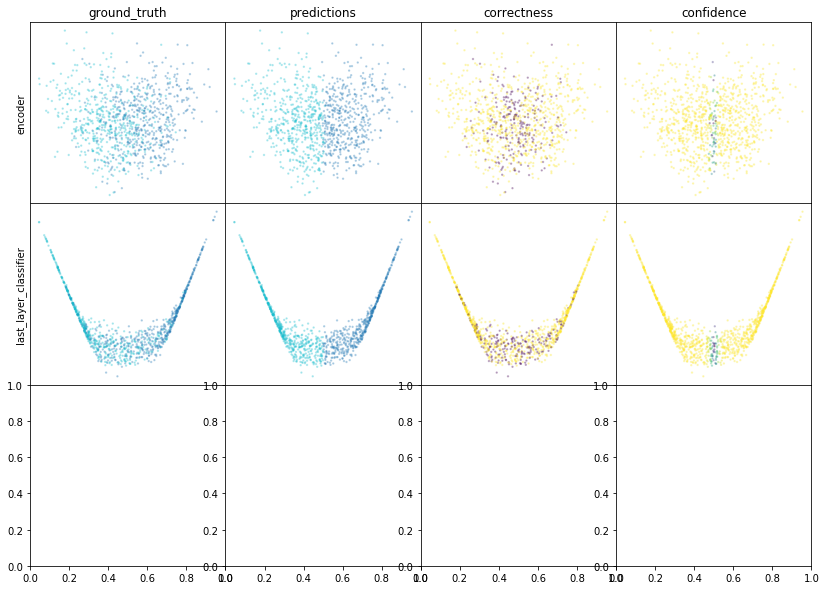

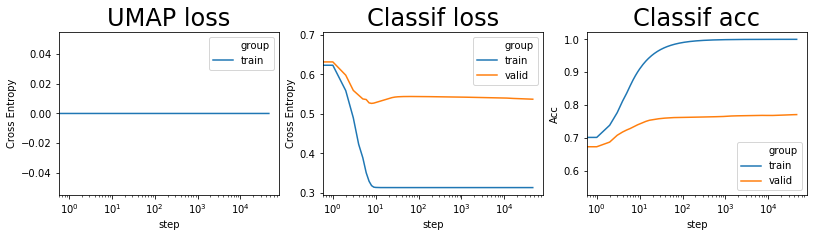

batch: 46000 | train acc: 1.0 | val acc: 0.7705


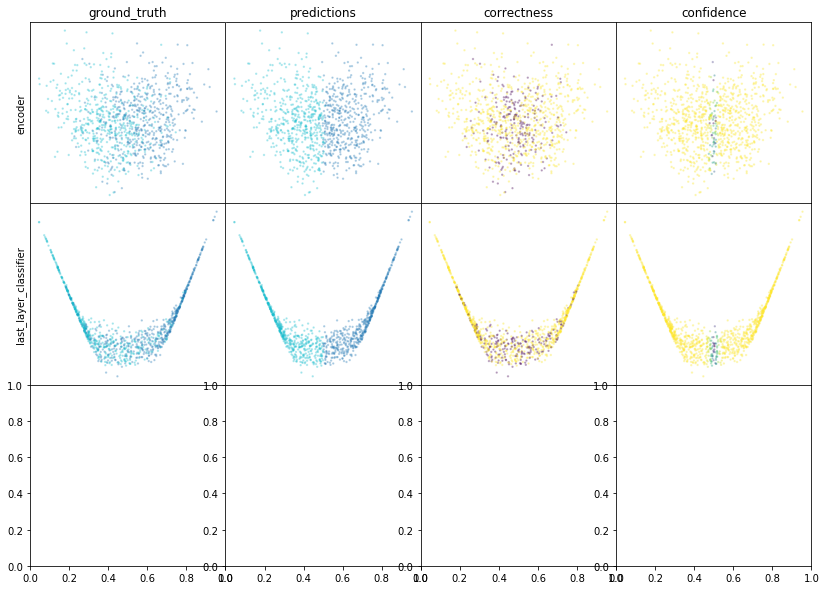

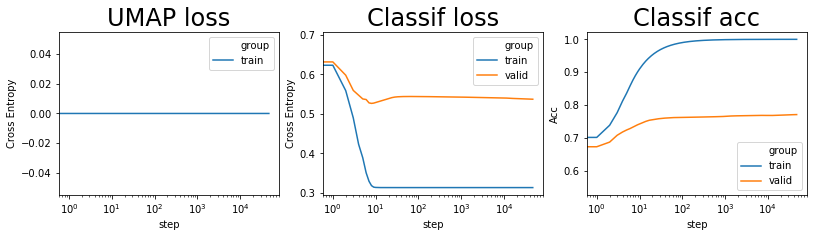

batch: 47000 | train acc: 1.0 | val acc: 0.7706
Early stopping because no improvement in 5 epochs


In [45]:
improved_this_epoch = True
for epoch in tqdm(zip(np.arange(N_EPOCHS)), total=N_EPOCHS, desc="epoch"):

    if not improved_this_epoch:
        epochs_without_improvement += 1

    if epochs_without_improvement > max_epochs_without_improvement:
        print(
            "Early stopping because no improvement in {} epochs".format(
                max_epochs_without_improvement
            )
        )
        break

    # reset improvement information
    improved_this_epoch = False
    last_improvement = (
        0  # delta between current batch, and the last batch that was an improvement
    )
    n_reloads = 0
    batches_since_last_reload = 0

    ####  build graph
    # embed data
    train_enc = model_data(X_train, 100, model.encoder)
    train_last_layer = model_data(train_enc, 100, pred_model)

    # construct graph
    umap_graph = build_fuzzy_simplicial_set(
        train_last_layer, y=Y_masked, n_neighbors=n_neighbors,
    )
    # get graph elements
    graph, epochs_per_sample, head, tail, weight, n_vertices = get_graph_elements(
        umap_graph, n_epochs=200
    )

    # create edge iterator
    edge_epoch, n_edges_per_epoch = create_edge_iterator(
        head,
        tail,
        weight,
        batch_size=batch_size,
        max_sample_repeats_per_epoch=max_sample_repeats_per_epoch,
    )

    BATCHES_PER_EPOCH = int(n_edges_per_epoch / batch_size)

    pbar = tqdm(total=BATCHES_PER_EPOCH, leave=False, desc="loss")

    for (batch_to, batch_from), (X, y), (X_val, y_val) in zip(
        edge_epoch, labeled_iter, data_valid
    ):

        # train
        (
            attraction_loss,
            repellant_loss,
            umap_loss,
            classifier_loss,
            classifier_acc,
        ) = model.train(batch_to=batch_to, batch_from=batch_from, X=X, y=y, umap_prop = umap_prop)

        # compute validation loss
        val_loss, val_acc = compute_classifier_loss(
            X_val,
            y_val,
            model.encoder,
            model.classifier,
            model.sparse_ce,
            model.class_acc_val,
        )
        
        pbar.update()
        pbar.set_description("val acc: {}".format(str(round(val_acc.numpy(), 5))))

        # save losses
        model.write_losses(
            tf.convert_to_tensor(batch, dtype=tf.int64),
            classifier_acc,
            classifier_loss,
            umap_loss,
            val_loss,
            val_acc,
        )

        # plot results
        if batch % plot_frequency == 0:
            plot_umap_classif_results(
                model,
                X_valid,
                Y_valid,
                X_train,
                X_labeled,
                Y_labeled,
                batch_size,
                cmap="tab10",
                cmap2="tab10",
            )
            print(
                "batch: {} | train acc: {} | val acc: {}".format(
                    str(batch),
                    str(round(classifier_acc.numpy(), 4)),
                    str(round(val_acc.numpy(), 4)),
                )
            )

        # make any improvement isn't a fluke of small batch size
        if batches_since_last_reload >= reload_tolerance:

            # save if validation accuracy went up
            if val_acc > best_saved_acc + max_save_delta:
                # save weights
                print(
                    "saving weights | batch = {} | acc = {}".format(
                        batch, round(val_acc.numpy() * 100, 3)
                    )
                )
                model.encoder.save_weights((cpt_path / "encoder").as_posix())
                model.classifier.save_weights((cpt_path / "classifier").as_posix())
                best_saved_acc = val_acc.numpy()
                # save batch number
                best_saved_batch = copy.deepcopy(batch)

            # reinitialize if validation accuracy went down
            if val_acc < (best_saved_acc - max_reinitialize_delta):
                # if
                if batches_since_last_reload >= reload_tolerance:
                    lr = model.optimizer.lr.numpy()
                    batches_since_last_reload = 0
                    print(
                        "batch {} | acc = {} | learn rate = {} | reloading weights from batch {} at acc {} | n reloads = {}".format(
                            batch,
                            str(round(val_acc.numpy(), 3)),
                            lr,
                            best_saved_batch,
                            int(best_saved_acc * 100),
                            n_reloads,
                        )
                    )
                    # reload weights
                    model.encoder.load_weights((cpt_path / "encoder").as_posix())
                    model.classifier.load_weights((cpt_path / "classifier").as_posix())

                    # set new learning rate
                    model.optimizer.lr.assign(lr / 2)

                    batch += 1
                    n_reloads += 1

                    # stop if reloaded too many times
                    if n_reloads >= max_reloads:
                        break

            # if there is an imporovement, set new best score
            if val_acc > best_acc + min_delta:
                improved_this_epoch = True
                last_improvement = 0
                best_acc = val_acc
            # if the model has not improved in patience batches, end epoch
            elif last_improvement >= patience:
                last_improvement = 0
                print(
                    "leaving epoch because no improvement in {} batches".format(
                        patience
                    )
                )
                break
            else:
                last_improvement += 1

        # up the ticker
        batch += 1
        batches_since_last_reload += 1
    pbar.close()

In [46]:
z_enc = model_data(X_valid, 100, encoder)
last_layer_class = model_data(z_enc, batch_size, pred_model)
z_pred = model_data(z_enc, batch_size, classifier)
confidence = np.max(z_pred, axis = 1)

valid_acc = tf.keras.metrics.sparse_categorical_accuracy(
    Y_valid, z_pred
).numpy()
print(np.mean(valid_acc))

0.773


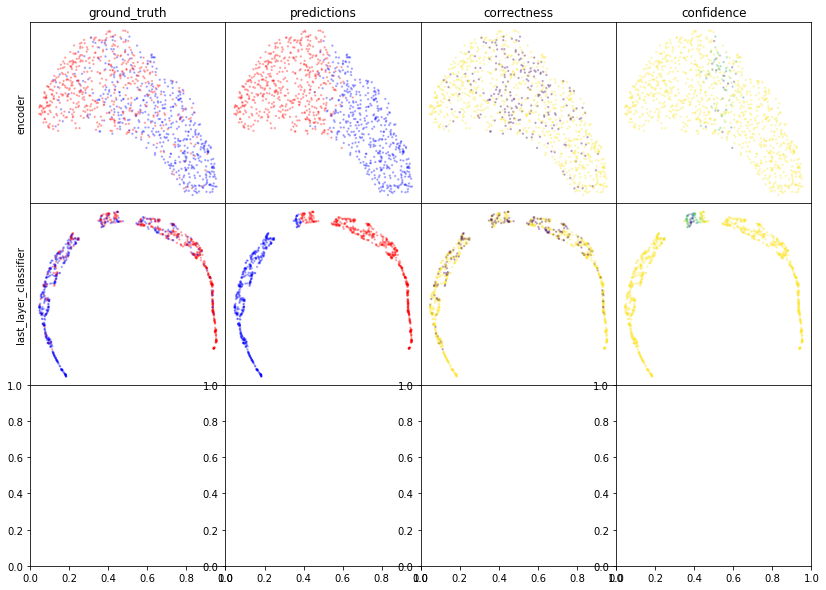

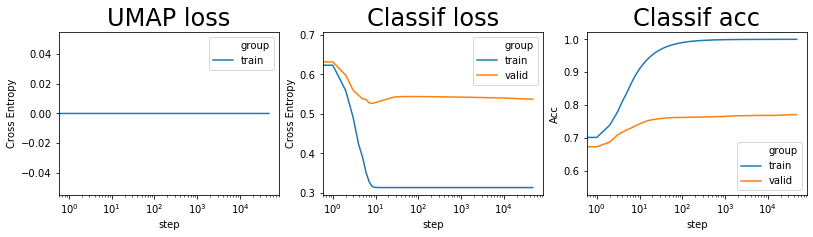

In [47]:
plot_umap_classif_results(model, X_valid, Y_valid, X_train, X_labeled, Y_labeled, batch_size, dralg=UMAP, cmap='bwr', cmap2='bwr')